<a href="https://colab.research.google.com/github/vak000/WL2021/blob/main/Segnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#[1] import and installations
!pip install torchnet
!pip install PyDrive
!pip install mock
import torch
import numpy as np
from google.colab import files
import h5py
import torchnet as tnt
import functools
import mock
import math
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import random
import torch.nn.functional as nnf
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm_notebook as tqdm
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from functools import partial

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 676 kB 31.0 MB/s 
     |████████████████████████████████| 54 kB 2.3 MB/s 
  Created wheel for torchnet: filename=torchnet-0.0.4-py3-none-any.whl size=29742 sha256=3c8b98ea8d2e84d7bbe3c6def5d16ffa503ed6e16b501c0980518cf48b6adceb
  Stored in directory: /root/.cache/pip/wheels/93/17/b3/86db1d93e9dae198813aa79831b403e4844d67986cf93894b5
  Created wheel for visdom: filename=visdom-0.1.8.9-py3-none-any.whl size=655250 sha256=b71ae58e685f979d5a032e2502e7a805e1b7e4349805784969ac1a584979a88c
  Stored in directory: /root/.cache/pip/wheels/2d/d1/9b/cde923274eac9cbb6ff0d8c7c72fe30a3da9095a38fd50bbf1
  Created wheel for torchfile: filename=torchfile-0.1.0-py3-none-any.whl size=5709 sha256=b91b157721d2b37423625bb77e5db02a6e56388c7db2cdeb7995582416cb002a
  Stored in directory: /root/.cache/pip/wheels/ac/5c/3a/a80e1c65880945c71fd833408cd1e9a8cb7e2f8f37620bb75b
Succ

In [6]:
#[2] Authentification
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

downloaded = drive.CreateFile({'id':'1qB9Gt9UCTokkSM4Fvy-srQUU9ir0Bke7'})
downloaded.GetContentFile('landCover.hdf5') 

In [7]:
#[4] building the train and test sets
data_file = h5py.File("landCover.hdf5",'r')
train_obs = data_file['train_observation'][:]
train_gt = data_file['train_gt'][:]
test_obs = data_file['test_observation'][:]
test_gt = data_file['test_gt'][:]
n_train = train_obs.shape[0]
n_test = test_obs.shape[0]
class_names = ["Urban", "Water", "Fields", "Road", "Vegetation", "Buildings"]

print("%d tiles for training, %d tiles for testing" % (n_train, n_test))

200 tiles for training, 100 tiles for testing


In [8]:
#[4] data loader

def augment(obs, gt):
  """the augmentation function"""
  return obs, gt#does nothing, leaves like that for now
  #random gaussian noise
  sigma, clip= 0.01, 0.02 # https://github.com/charlesq34/pointnet/blob/master/provider.py#L74
  obs = obs + np.clip(sigma * np.random.randn(*obs.shape), -1*clip, clip).astype(np.float32)
  #random rotation 0 90 180 270 degree
  n_turn =  np.random.randint(4)
  obs = np.rot90(obs, k=n_turn, axes=(1,2)).copy()
  gt = np.rot90(gt, k=n_turn, axes=(0,1)).copy()
  return obs, gt


def tile_loader(tile_index, train = True, cuda = 1):
  """
  load a tile and returns the obseravtion and associated ground truth
  INPUT:
  tile_index = int, index of the tile
  train = int, train = 1 iff in the train set
  cuda = int, cuda = 1 if using GPUs
  OUTPUT
  obs, [256 x 256 x 4] float array containing the observation
  gt, [256 x 256] uint8 array, containing the pixels semantic labels  
  """
  if train:
    obs = train_obs[tile_index,:,:,:].transpose(2,0,1) #put channels first
    gt = train_gt[tile_index,:,:]
  else:
    obs = test_obs[tile_index,:,:,:].transpose(2,0,1)
    gt = test_gt[tile_index,:,:]
    
  if train: #augmentation - for training only
    obs, gt = augment(obs, gt)   
  
  obs = torch.from_numpy(obs)
  gt = torch.from_numpy(gt)
  
  if cuda:
    obs = obs.cuda()
   
  return obs, gt.long()

#putting the dataset into the ListDataset wrapper
test_set  = tnt.dataset.ListDataset(list(range(n_test)),functools.partial(tile_loader, train=False))
train_set = tnt.dataset.ListDataset(list(range(n_train)),functools.partial(tile_loader, train=True))


In [9]:
#[5] functions used for visualization
def view_rgb(tile, ax = None):
  """ show the rgb values of the tile in figure ax"""
  if ax==None:
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')
  tile_corrected = np.minimum(np.maximum(tile[:3,:,], 0), 1) #normalization
  ax.imshow(tile_corrected.transpose(0,2).transpose(0,1)) #put channels back as dim 3
  plt.axis('off')
  
def view_infrared(tile, ax = None):
  """ show the infrared tile in figure ax"""
  if ax==None:
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')
  tile_corrected = np.minimum(np.maximum(tile[3,:,:], 0), 1) #normalization
  ax.imshow(tile_corrected,cmap='hot')
  plt.axis('off')

def view_labels(label, ax = None, mask = None,):
  """ show the ground truth with a colorcode corresponding to labels"""
  if ax==None:
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')
  if mask is not None:
    label[mask] = 99
  n_pixel = label.shape[1]
  colors = np.zeros((n_pixel,n_pixel,3))
  colors[np.where(label==99)] = [1  ,1  ,1  ] #not labelled
  colors[np.where(label==0)]  = [1  ,0.8,0.8] #building limit
  colors[np.where(label==1)]  = [0  ,0  ,1  ] #water
  colors[np.where(label==2)]  = [0.9,0.9,0  ] #fields
  colors[np.where(label==3)]  = [0.5,0.5,0.5] #road
  colors[np.where(label==4)]  = [0  ,.8  ,0  ] #vegetation
  colors[np.where(label==5)]  = [1,  0  ,0  ] #building
  ax.imshow(colors)
  plt.axis('off')
  
def view_error(pred, gt, ax = None):
  """ show the error between pred and gt with colorcode:
 green when 'gt'='pred', red when 'gt'!='pred' and black
 when unnannotated (gt = 0)"""
  if ax==None:
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')
  n_pixel = gt.shape[1]
  colors = np.zeros((n_pixel,n_pixel,3))
  colors[np.where(pred==gt.squeeze())] = [0, 1, 0] #correct prediction
  colors[np.where(pred!=gt.squeeze())] = [1, 0, 0] #error
  colors[np.where(gt.squeeze()==99)] = [0, 0, 0]   #unannotated 
  ax.imshow(colors)
  plt.axis('off')
  
def viewer(n_shown = 3, category = 'cig', train = True, model = None, use_mask = False):
  """ plot 'n_shown' random tiles train/test set with the following visuals:
  if 'c' in category : rgb color
  if 'i' in category : infrared
  if 'g' in category : ground truth
  if 'p' in category : prediction
  if 'e' in category : error
  Note that for 'p' or 'e' ou need to add a trained model as input
  
  """
  n_category = len(category) #number of types of image to show
  fig = plt.figure(figsize=(n_category * 5, n_shown * 5)) #adapted dimension
  
  subplot_index = 1 #keep track of current subplot
  
  #chose random tiles
  tile_indices = np.random.choice(n_train, n_shown) if train \
  else np.random.choice(n_test, n_shown)
  
  for tile_index in tile_indices:
    
    tile, gt = tile_loader(tile_index, train = train, cuda=0)
    
    if 'c' in category:
      ax = fig.add_subplot(n_shown, n_category, subplot_index, aspect='equal')
      if subplot_index <= n_category : 
        ax.set(title='RGB')
      view_rgb(tile, ax = ax)
      subplot_index += 1
    if 'i' in category:  
      ax = fig.add_subplot(n_shown, n_category, subplot_index, aspect='equal')
      if subplot_index <= n_category : 
        ax.set(title='Infrared')
      view_infrared(tile, ax = ax)
      subplot_index += 1
    if 'g' in category:  
      ax = fig.add_subplot(n_shown, n_category, subplot_index, aspect='equal')
      if subplot_index <= n_category : 
        ax.set(title='Ground Truth')
      view_labels(gt, ax = ax)
      subplot_index += 1
    if 'p' in category:  
      ax = fig.add_subplot(n_shown, n_category, subplot_index, aspect='equal')
      if subplot_index <= n_category : 
        ax.set(title='Prediction')
      pred = model(tile[None,:,:,:].cuda()).cpu().argmax(1).squeeze()
      if use_mask:
        pred[gt==99] = 99
      view_labels(pred, ax = ax)
      subplot_index += 1  
    if 'e' in category: 
      ax = fig.add_subplot(n_shown, n_category, subplot_index, aspect='equal')
      if subplot_index <= n_category : 
        ax.set(title='Error')
      pred = model(tile[None,:,:,:].cuda()).cpu().argmax(1).squeeze()
      view_error(pred, gt, ax = ax)
      subplot_index += 1
  plt.show()

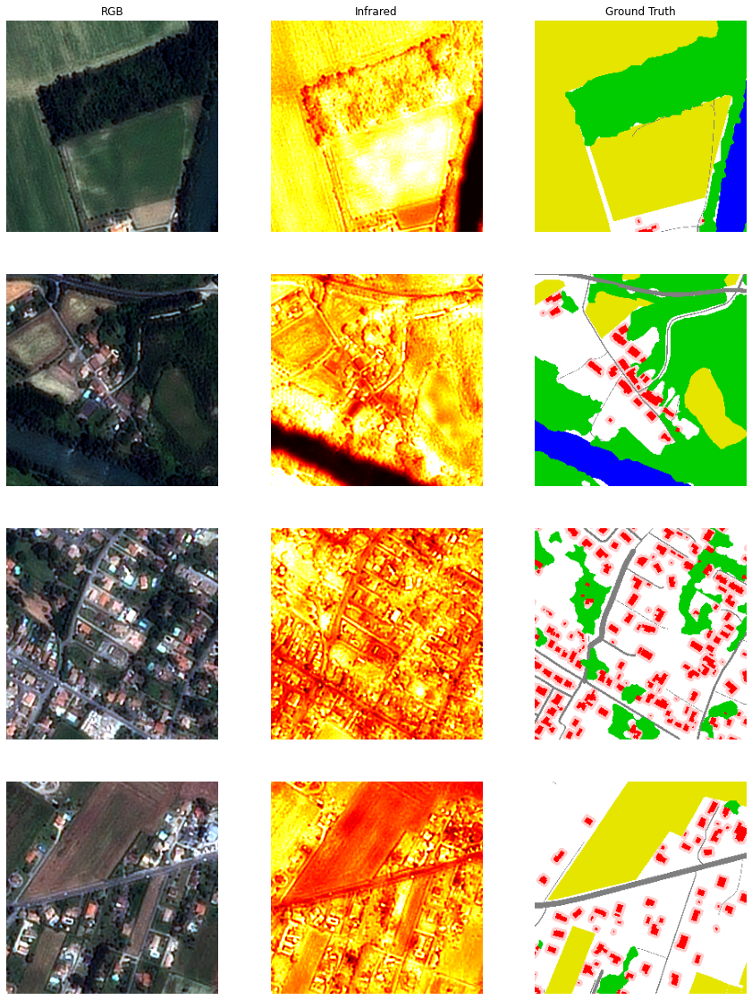

In [10]:
#[6]
viewer(n_shown=4)

In [11]:
#[7]
class ConfusionMatrix:
  def __init__(self, n_class, class_names):
    self.CM = np.zeros((n_class, n_class))
    self.n_class = n_class
    self.class_names = class_names
  
  def clear(self):
    self.CM = np.zeros((self.n_class, self.n_class))
    
  def add_batch(self, gt, pred):
    self.CM +=  confusion_matrix(gt, pred, labels = list(range(self.n_class)))
    
  def overall_accuracy(self):#percentage of correct classification
    return 100*np.diag(self.CM).sum()/self.CM.sum()

  def class_IoU(self, show = 1):
    ious = np.full(self.n_class, 0.)
    for i_class in range(self.n_class):
      ious[i_class] = self.CM[i_class,i_class] / (self.CM[i_class,].sum() + self.CM[:,i_class].sum() - self.CM[i_class,i_class])
    if show:
      print('  |  '.join('{} : {:3.2f}%'.format(name, 100*iou) for name, iou in zip(self.class_names,ious)))
    #do not count classes that are not present in the dataset in the mean IoU
    return 100*np.nansum(ious) / (np.logical_not(np.isnan(ious))).sum()

In [12]:
#[8]
m = ConfusionMatrix(6, class_names)
m.add_batch(np.array([0,1,1,5,2,0,0,4,0,5,3]), np.array([0,1,0,5,2,0,1,4,0,5,3]))
m.add_batch(np.array([0,1,5,1,2,1,0,2,3]), np.array([0,1,1,1,2,1,0,2,3]))
print(m.CM)
print("OA = %3.2f%%" % (m.overall_accuracy()))
m.class_IoU()
m.clear()

[[5. 1. 0. 0. 0. 0.]
 [1. 4. 0. 0. 0. 0.]
 [0. 0. 3. 0. 0. 0.]
 [0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 2.]]
OA = 85.00%
Urban : 71.43%  |  Water : 57.14%  |  Fields : 100.00%  |  Road : 100.00%  |  Vegetation : 100.00%  |  Buildings : 66.67%


In [24]:
#[9]
class SegNet(nn.Module):
  """
  SegNet network for semantic segmentation
  """
  
  def __init__(self, n_channels, encoder_conv_width, decoder_conv_width, n_class, cuda = 1):
    """
    initialization function
    n_channels, int, number of input channel
    encoder_conv_width, int list, size of the feature maps of convs for the encoder
    decoder_conv_width, int list, size of the feature maps of convs for the decoder
    n_class = int,  the number of classes
    """
    super(SegNet, self).__init__() #necessary for all classes extending the module class
    
    assert((encoder_conv_width[3] == encoder_conv_width[5]) \
     and (encoder_conv_width[1] == decoder_conv_width[1]))
    
    self.maxpool=nn.MaxPool2d(2,2,return_indices=True) #maxpooling layer
    self.unpool=nn.MaxUnpool2d(2,2) #unpooling layer
    #encoder
    self.c1 = nn.Sequential(nn.Conv2d(n_channels,encoder_conv_width[0],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(encoder_conv_width[0]),nn.ReLU(True))
    self.c2 = nn.Sequential(nn.Conv2d(encoder_conv_width[0],encoder_conv_width[1],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(encoder_conv_width[1]),nn.ReLU(True))
    self.c3 = nn.Sequential(nn.Conv2d(encoder_conv_width[1],encoder_conv_width[2],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(encoder_conv_width[2]),nn.ReLU(True))
    self.c4 = nn.Sequential(nn.Conv2d(encoder_conv_width[2],encoder_conv_width[3],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(encoder_conv_width[3]),nn.ReLU(True))
    self.c5 = nn.Sequential(nn.Conv2d(encoder_conv_width[3],encoder_conv_width[4],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(encoder_conv_width[4]),nn.ReLU(True))
    self.c6 = nn.Sequential(nn.Conv2d(encoder_conv_width[4],encoder_conv_width[5],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(encoder_conv_width[5]),nn.ReLU(True))
    #decoder
    self.c7=nn.Sequential(nn.Conv2d(encoder_conv_width[5]+encoder_conv_width[3],decoder_conv_width[0],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(decoder_conv_width[0]),nn.ReLU(True))
    self.c8=nn.Sequential(nn.Conv2d(decoder_conv_width[0],decoder_conv_width[1],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(decoder_conv_width[1]),nn.ReLU(True))       
    self.c9=nn.Sequential(nn.Conv2d(encoder_conv_width[1] + decoder_conv_width[1],decoder_conv_width[2],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(decoder_conv_width[2]),nn.ReLU(True))
    self.c10=nn.Sequential(nn.Conv2d(decoder_conv_width[2],decoder_conv_width[3],3,padding=1, padding_mode='reflect'),nn.BatchNorm2d(decoder_conv_width[3]),nn.ReLU(True))
    #final classifying layer
    self.classifier=nn.Conv2d(decoder_conv_width[3],n_class,3,padding=1, padding_mode='reflect')

    #weight initialization

    self.c1[0].apply(self.init_weights)
    self.c2[0].apply(self.init_weights)
    self.c3[0].apply(self.init_weights)
    self.c4[0].apply(self.init_weights)
    self.c5[0].apply(self.init_weights)
    self.c6[0].apply(self.init_weights)
    self.c7[0].apply(self.init_weights)
    self.c8[0].apply(self.init_weights)
    self.c9[0].apply(self.init_weights)
    self.c10[0].apply(self.init_weights)
    self.classifier.apply(self.init_weights)
    
    if cuda: #put the model on the GPU memory
      self.cuda()
    
  def init_weights(self,layer): #gaussian init for the conv layers
    nn.init.kaiming_normal_(layer.weight, mode='fan_out', nonlinearity='relu')
    
  def forward(self,input):
    """
    the function called to run inference
    """  
    #encoder
    #level 1
    x1 = self.c2(self.c1(input))
    x2, indices_1_2 =self.maxpool(x1)
    #level 2
    x3=self.c4(self.c3(x2))
    x4, indices_2_3 =self.maxpool(x3)
    #level 3
    x5 = self.c6(self.c5(x4))
    #decoder
    #level 2       
    y4 = self.unpool(x5, indices_2_3,x2.size())
    y3 = self.c8(self.c7(torch.cat((y4,x3),1)))
    #level 1       
    y2 = self.unpool(y3, indices_1_2,x1.size())
    y1 = self.c10(self.c9(torch.cat((y2,x1),1)))
    #output         
    out = self.classifier(y1)
    return out

In [25]:
#[10]
#==================TEST===============================
#we consider the first point cloud from the training set
tile, gt = tile_loader(0)
segnet = SegNet(4,[16,16,32,32,64,32], [32,16,32,16],6)
print(segnet)
print('Total number of parameters: {}'.format(sum([p.numel() for p in segnet.parameters()])))
pred = segnet(tile[None,:,:,:]) #the None indicate a batch size of 1
assert(pred.shape == torch.Size([1,6,256,256]))


SegNet(
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (unpool): MaxUnpool2d(kernel_size=(2, 2), stride=(2, 2), padding=(0, 0))
  (c1): Sequential(
    (0): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (c2): Sequential(
    (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (c3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (c4): Sequential(
    (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


In [19]:
#[11]
def train(model, optimizer, args):
  """train for one epoch"""
  model.train() #switch the model in training mode
  
  #the loader function will take care of the batching
  loader = torch.utils.data.DataLoader(train_set, \
         batch_size=args.batch_size, shuffle=True, drop_last=True)
  #tqdm will provide some nice progress bars
  loader = tqdm(loader, ncols=500)
  
  #will keep track of the loss
  loss_meter = tnt.meter.AverageValueMeter()
  cm = ConfusionMatrix(args.n_class, class_names = class_names)

  for index, (tiles, gt) in enumerate(loader):
    
    optimizer.zero_grad() #put gradient to zero
    
    pred = model(tiles) #compute the prediction

    loss = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)

    loss.backward() #compute gradients

    for p in model.parameters(): #we clip the gradient at norm 1
      p.grad.data.clamp_(-1, 1)
    
    optimizer.step() #one SGD step
    
    loss_meter.add(loss.item())
    labeled = np.where(gt.view(-1)!=99)[0] #select gt with a label
    #need to put the prediction back on the cpu and convert to numpy
    cm.add_batch(gt.view(-1)[labeled], pred.argmax(1).view(-1)[labeled].cpu().detach().numpy())
    
  return cm, loss_meter.value()[0]

def eval(model, args):
  """eval on test/validation set"""
  
  model.eval() #switch in eval mode
  
  loader = torch.utils.data.DataLoader(test_set, batch_size=1, shuffle=False, drop_last=False)
  
  loader = tqdm(loader, ncols=500)
  
  loss_meter = tnt.meter.AverageValueMeter()
  cm = ConfusionMatrix(args.n_class, class_names = class_names)

  with torch.no_grad():
    for index, (tiles, gt) in enumerate(loader):
      
      pred = model(tiles) #compute the prediction

      loss = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)
      
      loss_meter.add(loss.item())
      labeled = np.where(gt.view(-1)!=99)[0] #select gt with a label
      #need to put the prediction back on the cpu and convert to numpy
      cm.add_batch(gt.view(-1)[labeled], pred.argmax(1).view(-1)[labeled].cpu().detach().numpy())
      
  return cm, loss_meter.value()[0]


def train_full(args):
  """The full training loop"""
  #initialize the model
  
  model = SegNet(args.n_channel, args.conv_width, args.dconv_width, args.n_class)

  print('Total number of parameters: {}'.format(sum([p.numel() for p in model.parameters()])))
  
  #define the optimizer
  #adam optimizer is always a good guess for classification
  optimizer = optim.Adam(model.parameters(), lr=args.lr)
  
  TESTCOLOR = '\033[104m'
  TRAINCOLOR = '\033[100m'
  NORMALCOLOR = '\033[0m'
  
  for i_epoch in range(args.n_epoch):
    #train one epoch
    cm_train, loss_train = train(model, optimizer, args)
    print(TRAINCOLOR)
    print('Epoch %3d -> Train Overall Accuracy: %3.2f%% Train mIoU : %3.2f%% Train Loss: %1.4f' % (i_epoch, cm_train.overall_accuracy(), cm_train.class_IoU(), loss_train) + NORMALCOLOR)

    if (i_epoch == args.n_epoch - 1) or (args.n_epoch_test != 0 and i_epoch % args.n_epoch_test == 0 and i_epoch > 0):
      #periodic testing
      cm_test, loss_test = eval(model, args)
      print(TESTCOLOR)
      print('Test Overall Accuracy: %3.2f%% Test mIoU : %3.2f%%  Test Loss: %1.4f' % (cm_test.overall_accuracy(), cm_test.class_IoU(), loss_test) + NORMALCOLOR)
      viewer(n_shown = 1, train = False, model = model, category = 'cigpe', use_mask = False)
  return model

Total number of parameters: 92166


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 17.44%  |  Water : 38.14%  |  Fields : 64.76%  |  Road : 2.01%  |  Vegetation : 54.10%  |  Buildings : 8.47%
Epoch   0 -> Train Overall Accuracy: 65.83% Train mIoU : 30.82% Train Loss: 1.1756


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 36.03%  |  Water : 73.22%  |  Fields : 84.65%  |  Road : 24.40%  |  Vegetation : 69.44%  |  Buildings : 17.15%
Epoch   1 -> Train Overall Accuracy: 79.90% Train mIoU : 50.81% Train Loss: 0.5906


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 36.97%  |  Water : 76.75%  |  Fields : 84.14%  |  Road : 31.44%  |  Vegetation : 68.84%  |  Buildings : 23.40%
Epoch   2 -> Train Overall Accuracy: 80.21% Train mIoU : 53.59% Train Loss: 0.5707


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 41.40%  |  Water : 79.44%  |  Fields : 86.42%  |  Road : 38.17%  |  Vegetation : 71.07%  |  Buildings : 31.06%
Epoch   3 -> Train Overall Accuracy: 82.49% Train mIoU : 57.93% Train Loss: 0.4997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 44.16%  |  Water : 81.44%  |  Fields : 88.12%  |  Road : 42.10%  |  Vegetation : 70.43%  |  Buildings : 32.90%
Epoch   4 -> Train Overall Accuracy: 83.33% Train mIoU : 59.86% Train Loss: 0.4640


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 45.24%  |  Water : 82.04%  |  Fields : 86.84%  |  Road : 41.71%  |  Vegetation : 71.40%  |  Buildings : 35.17%
Epoch   5 -> Train Overall Accuracy: 83.30% Train mIoU : 60.40% Train Loss: 0.4741


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 46.63%  |  Water : 89.36%  |  Fields : 86.86%  |  Road : 40.21%  |  Vegetation : 72.39%  |  Buildings : 35.62%
Test Overall Accuracy: 83.77% Test mIoU : 61.85%  Test Loss: 0.4983


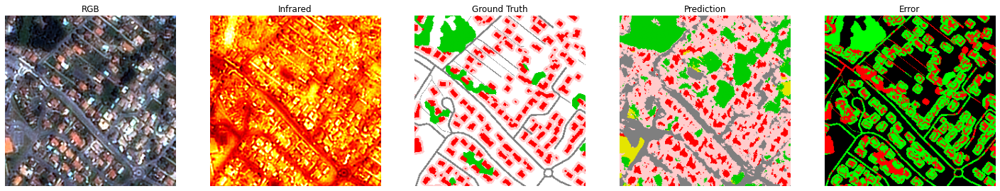

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 46.41%  |  Water : 79.42%  |  Fields : 87.41%  |  Road : 42.12%  |  Vegetation : 70.92%  |  Buildings : 39.43%
Epoch   6 -> Train Overall Accuracy: 83.87% Train mIoU : 60.95% Train Loss: 0.4420


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 45.46%  |  Water : 80.95%  |  Fields : 89.67%  |  Road : 40.77%  |  Vegetation : 74.53%  |  Buildings : 39.38%
Epoch   7 -> Train Overall Accuracy: 85.15% Train mIoU : 61.79% Train Loss: 0.4289


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 48.67%  |  Water : 83.72%  |  Fields : 90.55%  |  Road : 43.60%  |  Vegetation : 75.27%  |  Buildings : 43.17%
Epoch   8 -> Train Overall Accuracy: 85.84% Train mIoU : 64.16% Train Loss: 0.3956


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 49.01%  |  Water : 83.76%  |  Fields : 87.98%  |  Road : 43.89%  |  Vegetation : 69.55%  |  Buildings : 43.73%
Epoch   9 -> Train Overall Accuracy: 84.50% Train mIoU : 62.99% Train Loss: 0.4241


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 49.94%  |  Water : 83.32%  |  Fields : 90.44%  |  Road : 45.38%  |  Vegetation : 74.75%  |  Buildings : 45.17%
Epoch  10 -> Train Overall Accuracy: 86.00% Train mIoU : 64.83% Train Loss: 0.4014


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 48.61%  |  Water : 90.15%  |  Fields : 91.89%  |  Road : 44.57%  |  Vegetation : 77.60%  |  Buildings : 47.54%
Test Overall Accuracy: 87.27% Test mIoU : 66.73%  Test Loss: 0.4164


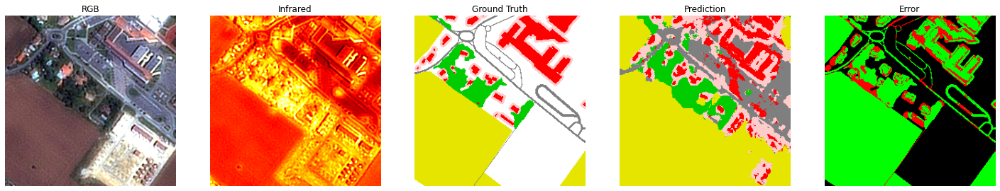

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.10%  |  Water : 82.51%  |  Fields : 92.23%  |  Road : 44.29%  |  Vegetation : 76.32%  |  Buildings : 44.89%
Epoch  11 -> Train Overall Accuracy: 86.79% Train mIoU : 65.22% Train Loss: 0.3799


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.24%  |  Water : 84.85%  |  Fields : 90.28%  |  Road : 46.79%  |  Vegetation : 73.75%  |  Buildings : 47.37%
Epoch  12 -> Train Overall Accuracy: 86.23% Train mIoU : 65.71% Train Loss: 0.3864


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.76%  |  Water : 84.92%  |  Fields : 91.31%  |  Road : 49.71%  |  Vegetation : 74.86%  |  Buildings : 47.75%
Epoch  13 -> Train Overall Accuracy: 87.21% Train mIoU : 66.72% Train Loss: 0.3605


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.89%  |  Water : 84.91%  |  Fields : 92.29%  |  Road : 47.04%  |  Vegetation : 76.31%  |  Buildings : 47.15%
Epoch  14 -> Train Overall Accuracy: 87.59% Train mIoU : 66.76% Train Loss: 0.3542


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.20%  |  Water : 83.47%  |  Fields : 91.69%  |  Road : 47.26%  |  Vegetation : 75.82%  |  Buildings : 48.09%
Epoch  15 -> Train Overall Accuracy: 87.10% Train mIoU : 66.42% Train Loss: 0.3625


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.63%  |  Water : 89.55%  |  Fields : 92.49%  |  Road : 44.11%  |  Vegetation : 78.54%  |  Buildings : 48.75%
Test Overall Accuracy: 87.62% Test mIoU : 67.51%  Test Loss: 0.3974


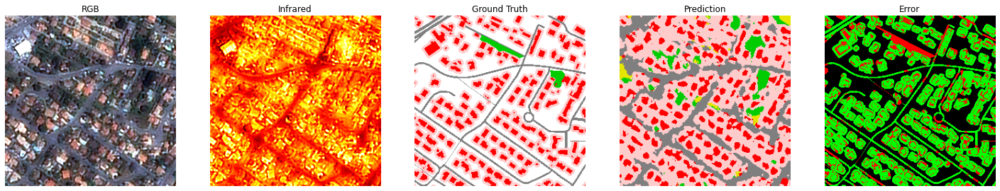

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.68%  |  Water : 85.26%  |  Fields : 90.49%  |  Road : 50.05%  |  Vegetation : 74.79%  |  Buildings : 49.84%
Epoch  16 -> Train Overall Accuracy: 86.95% Train mIoU : 67.35% Train Loss: 0.3663


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.99%  |  Water : 82.43%  |  Fields : 92.58%  |  Road : 48.60%  |  Vegetation : 76.97%  |  Buildings : 49.28%
Epoch  17 -> Train Overall Accuracy: 87.96% Train mIoU : 67.31% Train Loss: 0.3466


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.38%  |  Water : 85.40%  |  Fields : 91.70%  |  Road : 50.64%  |  Vegetation : 75.72%  |  Buildings : 50.18%
Epoch  18 -> Train Overall Accuracy: 87.60% Train mIoU : 68.01% Train Loss: 0.3467


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.51%  |  Water : 83.47%  |  Fields : 90.52%  |  Road : 51.67%  |  Vegetation : 74.42%  |  Buildings : 50.47%
Epoch  19 -> Train Overall Accuracy: 87.09% Train mIoU : 67.35% Train Loss: 0.3704


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.81%  |  Water : 83.34%  |  Fields : 90.60%  |  Road : 50.27%  |  Vegetation : 73.23%  |  Buildings : 51.29%
Epoch  20 -> Train Overall Accuracy: 86.70% Train mIoU : 66.92% Train Loss: 0.3719


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 49.81%  |  Water : 89.02%  |  Fields : 89.49%  |  Road : 43.25%  |  Vegetation : 74.94%  |  Buildings : 47.07%
Test Overall Accuracy: 85.65% Test mIoU : 65.60%  Test Loss: 0.4453


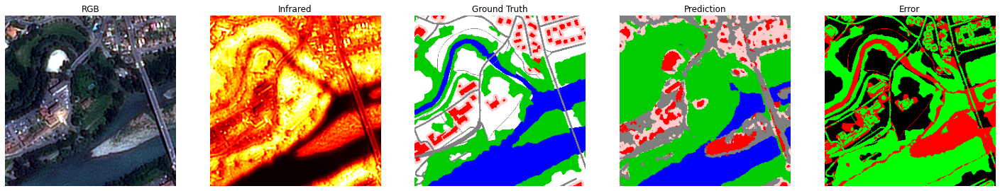

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.32%  |  Water : 82.72%  |  Fields : 91.10%  |  Road : 50.95%  |  Vegetation : 76.30%  |  Buildings : 50.89%
Epoch  21 -> Train Overall Accuracy: 87.40% Train mIoU : 67.55% Train Loss: 0.3643


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.02%  |  Water : 85.42%  |  Fields : 91.47%  |  Road : 52.62%  |  Vegetation : 75.96%  |  Buildings : 50.82%
Epoch  22 -> Train Overall Accuracy: 87.58% Train mIoU : 68.39% Train Loss: 0.3540


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.13%  |  Water : 85.48%  |  Fields : 90.64%  |  Road : 51.96%  |  Vegetation : 74.25%  |  Buildings : 50.86%
Epoch  23 -> Train Overall Accuracy: 87.41% Train mIoU : 67.89% Train Loss: 0.3587


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.60%  |  Water : 83.98%  |  Fields : 91.11%  |  Road : 52.08%  |  Vegetation : 74.35%  |  Buildings : 52.43%
Epoch  24 -> Train Overall Accuracy: 87.43% Train mIoU : 68.09% Train Loss: 0.3666


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.81%  |  Water : 84.49%  |  Fields : 92.64%  |  Road : 52.54%  |  Vegetation : 77.62%  |  Buildings : 52.77%
Epoch  25 -> Train Overall Accuracy: 88.57% Train mIoU : 69.31% Train Loss: 0.3281


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.31%  |  Water : 90.67%  |  Fields : 90.59%  |  Road : 46.47%  |  Vegetation : 78.09%  |  Buildings : 49.37%
Test Overall Accuracy: 87.53% Test mIoU : 67.92%  Test Loss: 0.4052


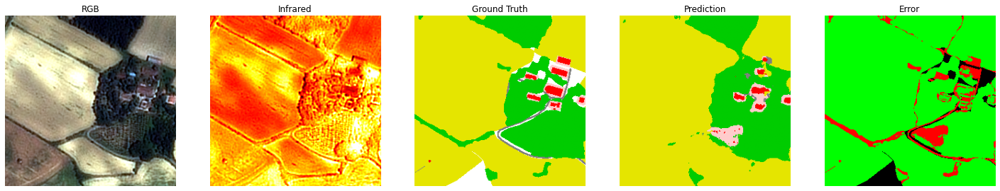

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.06%  |  Water : 80.17%  |  Fields : 90.65%  |  Road : 48.36%  |  Vegetation : 75.15%  |  Buildings : 51.05%
Epoch  26 -> Train Overall Accuracy: 87.00% Train mIoU : 66.74% Train Loss: 0.3694


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.22%  |  Water : 80.79%  |  Fields : 92.25%  |  Road : 49.13%  |  Vegetation : 77.78%  |  Buildings : 50.51%
Epoch  27 -> Train Overall Accuracy: 88.02% Train mIoU : 67.62% Train Loss: 0.3449


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.20%  |  Water : 79.86%  |  Fields : 91.55%  |  Road : 48.40%  |  Vegetation : 75.14%  |  Buildings : 50.37%
Epoch  28 -> Train Overall Accuracy: 87.36% Train mIoU : 66.59% Train Loss: 0.3619


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.33%  |  Water : 84.03%  |  Fields : 92.24%  |  Road : 54.42%  |  Vegetation : 76.70%  |  Buildings : 51.80%
Epoch  29 -> Train Overall Accuracy: 88.29% Train mIoU : 69.25% Train Loss: 0.3295


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.86%  |  Water : 84.85%  |  Fields : 92.06%  |  Road : 55.65%  |  Vegetation : 77.02%  |  Buildings : 53.61%
Epoch  30 -> Train Overall Accuracy: 88.57% Train mIoU : 70.01% Train Loss: 0.3246


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 50.83%  |  Water : 90.83%  |  Fields : 88.25%  |  Road : 47.89%  |  Vegetation : 72.74%  |  Buildings : 47.53%
Test Overall Accuracy: 85.71% Test mIoU : 66.35%  Test Loss: 0.4543


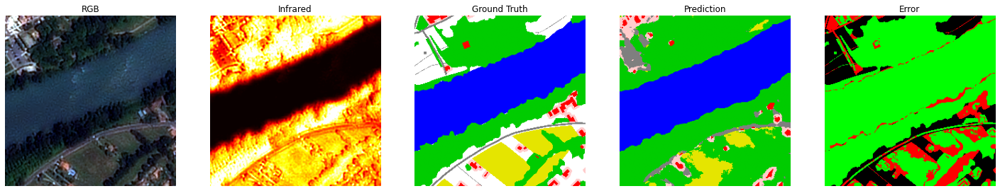

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.14%  |  Water : 85.26%  |  Fields : 92.53%  |  Road : 55.30%  |  Vegetation : 78.01%  |  Buildings : 53.57%
Epoch  31 -> Train Overall Accuracy: 88.81% Train mIoU : 70.47% Train Loss: 0.3190


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.13%  |  Water : 84.40%  |  Fields : 92.29%  |  Road : 56.15%  |  Vegetation : 77.29%  |  Buildings : 54.11%
Epoch  32 -> Train Overall Accuracy: 88.78% Train mIoU : 70.23% Train Loss: 0.3241


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.05%  |  Water : 84.80%  |  Fields : 93.40%  |  Road : 57.64%  |  Vegetation : 77.86%  |  Buildings : 54.78%
Epoch  33 -> Train Overall Accuracy: 89.48% Train mIoU : 71.09% Train Loss: 0.2997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.18%  |  Water : 85.52%  |  Fields : 93.10%  |  Road : 58.39%  |  Vegetation : 77.90%  |  Buildings : 55.32%
Epoch  34 -> Train Overall Accuracy: 89.32% Train mIoU : 71.40% Train Loss: 0.3011


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.35%  |  Water : 85.98%  |  Fields : 93.19%  |  Road : 58.69%  |  Vegetation : 78.41%  |  Buildings : 55.87%
Epoch  35 -> Train Overall Accuracy: 89.36% Train mIoU : 71.58% Train Loss: 0.3028


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.97%  |  Water : 91.27%  |  Fields : 93.40%  |  Road : 50.13%  |  Vegetation : 80.57%  |  Buildings : 42.96%
Test Overall Accuracy: 88.74% Test mIoU : 69.05%  Test Loss: 0.3641


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


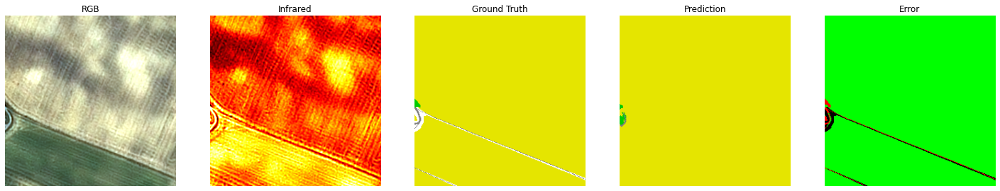

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.20%  |  Water : 86.41%  |  Fields : 92.29%  |  Road : 59.39%  |  Vegetation : 77.13%  |  Buildings : 55.31%
Epoch  36 -> Train Overall Accuracy: 88.84% Train mIoU : 71.46% Train Loss: 0.3133


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.47%  |  Water : 84.63%  |  Fields : 93.37%  |  Road : 58.02%  |  Vegetation : 78.11%  |  Buildings : 55.21%
Epoch  37 -> Train Overall Accuracy: 89.29% Train mIoU : 71.13% Train Loss: 0.3050


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.71%  |  Water : 86.00%  |  Fields : 93.09%  |  Road : 58.29%  |  Vegetation : 78.19%  |  Buildings : 55.01%
Epoch  38 -> Train Overall Accuracy: 89.30% Train mIoU : 71.38% Train Loss: 0.2989


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.66%  |  Water : 86.63%  |  Fields : 93.00%  |  Road : 59.39%  |  Vegetation : 77.94%  |  Buildings : 55.73%
Epoch  39 -> Train Overall Accuracy: 89.39% Train mIoU : 71.89% Train Loss: 0.3010


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.94%  |  Water : 84.50%  |  Fields : 93.52%  |  Road : 60.98%  |  Vegetation : 78.69%  |  Buildings : 56.71%
Epoch  40 -> Train Overall Accuracy: 89.68% Train mIoU : 72.23% Train Loss: 0.2950


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.12%  |  Water : 90.76%  |  Fields : 93.64%  |  Road : 50.59%  |  Vegetation : 80.37%  |  Buildings : 49.94%
Test Overall Accuracy: 89.08% Test mIoU : 70.24%  Test Loss: 0.3603


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


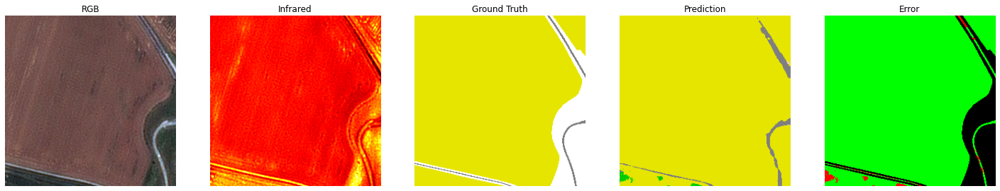

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.40%  |  Water : 85.67%  |  Fields : 93.19%  |  Road : 56.30%  |  Vegetation : 79.35%  |  Buildings : 53.98%
Epoch  41 -> Train Overall Accuracy: 89.47% Train mIoU : 71.15% Train Loss: 0.2985


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.65%  |  Water : 85.93%  |  Fields : 93.62%  |  Road : 60.16%  |  Vegetation : 79.07%  |  Buildings : 55.69%
Epoch  42 -> Train Overall Accuracy: 89.79% Train mIoU : 72.19% Train Loss: 0.2939


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 60.45%  |  Water : 86.50%  |  Fields : 93.97%  |  Road : 61.65%  |  Vegetation : 79.92%  |  Buildings : 56.49%
Epoch  43 -> Train Overall Accuracy: 90.09% Train mIoU : 73.16% Train Loss: 0.2795


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.71%  |  Water : 84.84%  |  Fields : 93.48%  |  Road : 61.64%  |  Vegetation : 79.18%  |  Buildings : 57.31%
Epoch  44 -> Train Overall Accuracy: 89.90% Train mIoU : 72.69% Train Loss: 0.2859


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.53%  |  Water : 86.04%  |  Fields : 94.25%  |  Road : 60.25%  |  Vegetation : 79.48%  |  Buildings : 56.05%
Epoch  45 -> Train Overall Accuracy: 89.89% Train mIoU : 72.60% Train Loss: 0.2857


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.75%  |  Water : 89.51%  |  Fields : 93.75%  |  Road : 41.97%  |  Vegetation : 80.01%  |  Buildings : 50.35%
Test Overall Accuracy: 88.63% Test mIoU : 68.56%  Test Loss: 0.3780


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


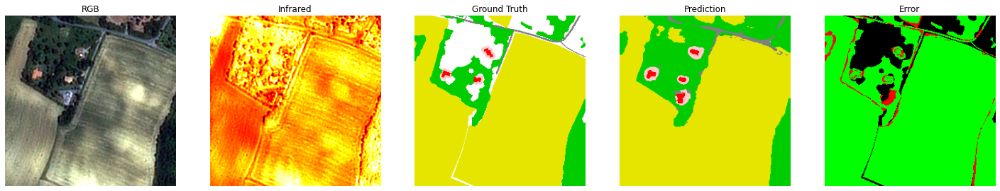

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 60.24%  |  Water : 86.46%  |  Fields : 93.27%  |  Road : 59.17%  |  Vegetation : 78.43%  |  Buildings : 55.56%
Epoch  46 -> Train Overall Accuracy: 89.56% Train mIoU : 72.19% Train Loss: 0.2913


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.45%  |  Water : 85.38%  |  Fields : 93.37%  |  Road : 60.01%  |  Vegetation : 79.34%  |  Buildings : 56.07%
Epoch  47 -> Train Overall Accuracy: 89.83% Train mIoU : 72.27% Train Loss: 0.2954


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.79%  |  Water : 86.72%  |  Fields : 94.14%  |  Road : 62.53%  |  Vegetation : 79.85%  |  Buildings : 57.24%
Epoch  48 -> Train Overall Accuracy: 90.15% Train mIoU : 73.38% Train Loss: 0.2805


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if __name__ == '__main__':


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 60.25%  |  Water : 87.15%  |  Fields : 93.53%  |  Road : 61.99%  |  Vegetation : 78.99%  |  Buildings : 57.27%
Epoch  49 -> Train Overall Accuracy: 90.03% Train mIoU : 73.20% Train Loss: 0.2818


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.12%  |  Water : 91.26%  |  Fields : 89.94%  |  Road : 56.67%  |  Vegetation : 75.99%  |  Buildings : 54.42%
Test Overall Accuracy: 87.77% Test mIoU : 70.73%  Test Loss: 0.3857


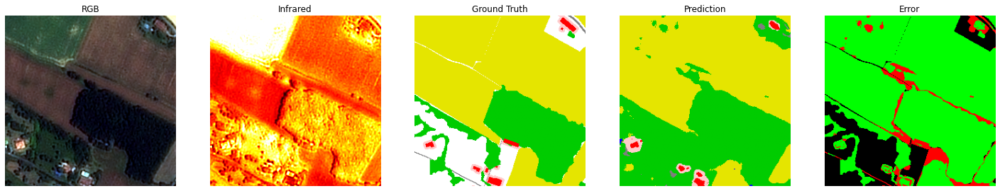

In [26]:
#[12]
args = mock.Mock() #stores the parameters
args.n_epoch = 50
args.n_epoch_test = int(5) #periodicity of evaluation on test set
args.batch_size = 16
args.n_class = 6
args.n_channel = 4
args.conv_width = [16,16,32,32,64,32]
args.dconv_width = [32,16,32,16]
args.cuda = 1
args.lr = 5e-3

trained_model = train_full(args)


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


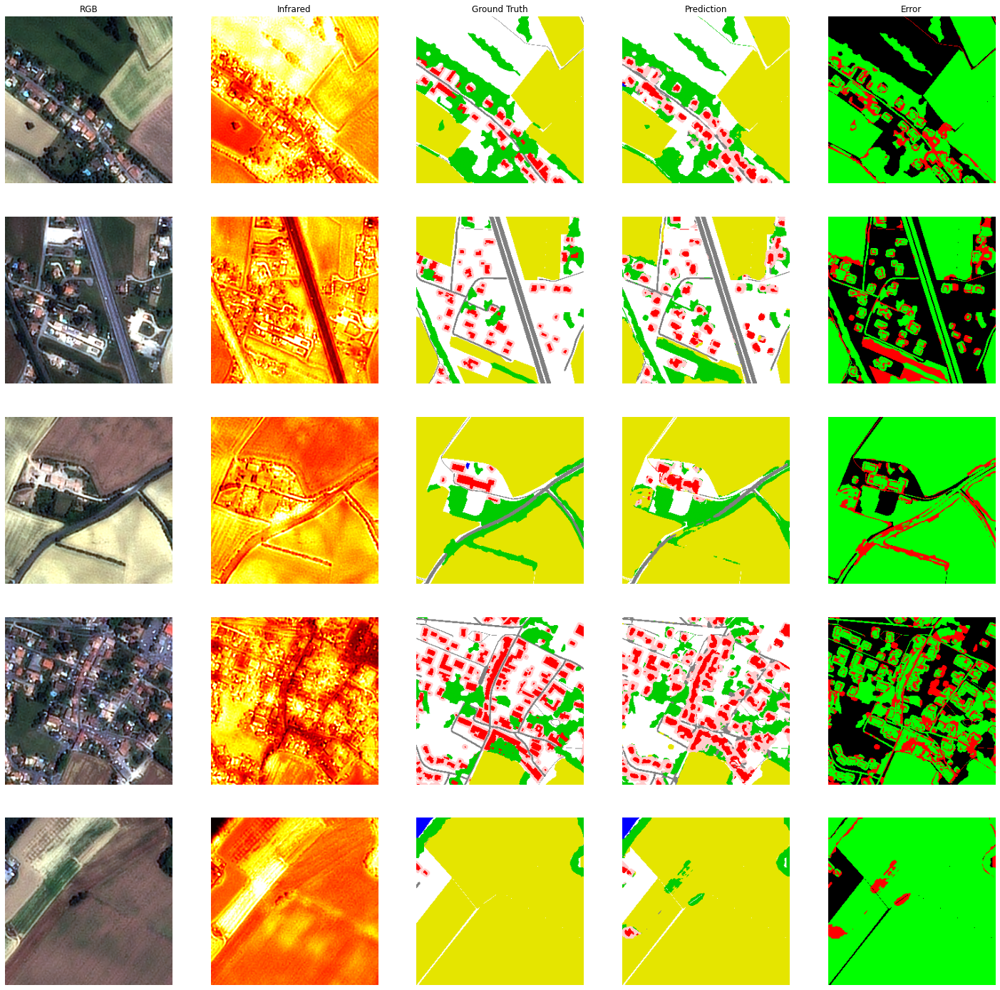

In [27]:
#[13]
viewer(n_shown=5, category = 'cigpe', model = trained_model, train = False, use_mask = True)


In [29]:
#[14]
def view_embeddings(fmap, ax = None):
  if ax==None:
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')
  fmap_dim = fmap.shape[1]
  n_pix = fmap.shape[2]
  #we use a pca to project the emebddings to a RGB space
  pca = PCA(n_components=3)
  pca.fit(np.eye(fmap_dim))
  #we need to adapt dimension and memory allocation to CPU
  fmap_ = fmap.cpu().detach().numpy().squeeze().reshape((fmap_dim, n_pix * n_pix)).transpose(1,0)
  color = pca.transform(fmap_)
  #we normalize for visibility
  color = np.maximum(np.minimum(((color - color.mean(1, keepdims = True) +0.5) / (2 * color.std(1, keepdims = True))), 1), 0)
  color = color.reshape((n_pix, n_pix,3), order= 'C')
  ax.imshow(color)
  plt.axis('off')

def view_U(model, tile_index = None, train = False):
  if tile_index is None:
    tile_index = np.random.randint(n_train) if train \
    else np.random.randint(n_test)
  tile, gt = tile_loader(tile_index, train = train, cuda=1)
    
  input = tile[None,:,:,:]
  x1 = model.c2(model.c1(input))
  x2, indices_1_2 = model.maxpool(x1)
  #level 2
  x3 = model.c4(model.c3(x2))
  x4, indices_2_3 = model.maxpool(x3)
  #level 3
  x5 = model.c6(model.c5(x4))
  #level 2       
  y4 = model.unpool(x5, indices_2_3,x2.size())
  y3 = model.c8(model.c7(torch.cat((y4,x3),1)))
  #level 1       
  y2 = model.unpool(y3, indices_1_2,x1.size())
  y1 = model.c10(model.c9(torch.cat((y2,x1),1)))
  #output       
  out = model.classifier(y1)
  pred = out.argmax(1)

  fig = plt.figure(figsize=(25, 10)) #adapted dimension
  ax = fig.add_subplot(3, 7, 1, aspect=1)
  ax.set(title='Input : %d x %d x %d' %(tile.shape))
  view_rgb(tile.cpu(), ax)
  ax = fig.add_subplot(3, 7, 2, aspect=1)
  ax.set(title='x1 : %d x %d x %d' %(x1.shape[1:]))
  view_embeddings(x1, ax)
  ax = fig.add_subplot(3, 7, 9, aspect=1)
  ax.set(title='x2 : %d x %d x %d' %(x2.shape[1:]))
  view_embeddings(x2, ax)
  ax = fig.add_subplot(3, 7, 10, aspect=1)
  ax.set(title='x3 : %d x %d x %d' %(x3.shape[1:]))
  view_embeddings(x3, ax)
  ax = fig.add_subplot(3, 7, 17, aspect=1)
  ax.set(title='x4 : %d x %d x %d' %(x4.shape[1:]))
  view_embeddings(x4, ax)
  ax = fig.add_subplot(3, 7, 18, aspect=1)
  ax.set(title='x5 : %d x %d x %d' %(x5.shape[1:]))
  view_embeddings(x5, ax)
  ax = fig.add_subplot(3, 7, 11, aspect=1)
  ax.set(title='y4 : %d x %d x %d' %(y4.shape[1:]))
  view_embeddings(y4, ax)
  ax = fig.add_subplot(3, 7, 12, aspect=1)
  ax.set(title='y3 : %d x %d x %d' %(y3.shape[1:]))
  view_embeddings(y3, ax)
  ax = fig.add_subplot(3, 7, 5, aspect=1)
  ax.set(title='y2 : %d x %d x %d' %(y2.shape[1:]))
  view_embeddings(y2, ax)
  ax = fig.add_subplot(3, 7, 6, aspect=1)
  ax.set(title='y1 : %d x %d x %d' %(y1.shape[1:]))
  view_embeddings(y1, ax)
  ax = fig.add_subplot(3, 7, 7, aspect=1)
  ax.set(title='Output : 6 x %d x %d' %(tile.shape[1:]))
  view_labels(pred.cpu().detach().numpy().squeeze(), ax)
  ax = fig.add_subplot(3, 7, 14, aspect=1)
  ax.set(title='Ground Truth : 6 x %d x %d' %(tile.shape[1:]))
  view_labels(gt, ax)
  ax = fig.add_subplot(3, 7, 21, aspect=1)
  ax.set(title='Error')
  view_error(pred.cpu().detach().numpy().squeeze(), gt.numpy(), ax)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


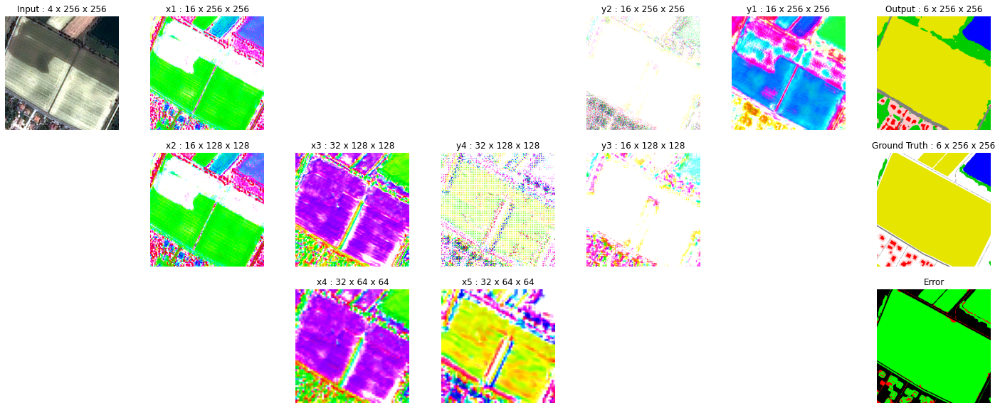

In [30]:
#[15]]
view_U(trained_model)

In [31]:
#[16]
def compute_adjacency_graph(n = 256, cuda = 1):
  """
  compute the 4-adjacency graph for a square image of size n
  return a matrix E of size M x 4 with M the number of edges
  M[i,:2] is the coordinates of the origin of the edge
  M[i,2:] is the coordinates of the target of the edges
  """
  edges = np.zeros((2*n**2,4), dtype='int64')
  index_edg = 0
  for i in range(n):
    for j in range(n):
      if i < n-1:
        edges[index_edg,:] = [i,j,i+1,j]
        index_edg += 1
      if j < n-1:
        edges[index_edg,:] = [i,j,i,j+1]
        index_edg += 1
  return edges[:index_edg,:]

In [32]:
#[17]
def TV(x,edges):
  return torch.abs(x[:,:,edges[:,0],edges[:,1]] - x[:,:,edges[:,2],edges[:,3]]).sum() / edges.shape[0] / x.shape[0]

In [33]:
def train_TV(model, optimizer, edges, weight_TV, args):
  """train for one epoch"""
  model.train() #switch the model in training mode
  
  #the loader function will take care of the batching
  loader = torch.utils.data.DataLoader(train_set, \
         batch_size=args.batch_size, shuffle=True, drop_last=True)
  #tqdm will provide some nice progress bars
  loader = tqdm(loader, ncols=500)
  
  #will keep track of the loss
  loss_meter = tnt.meter.AverageValueMeter()
  loss_acc_meter = tnt.meter.AverageValueMeter()
  loss_TV_meter = tnt.meter.AverageValueMeter()
  cm = ConfusionMatrix(args.n_class, class_names = class_names)

  for index, (tiles, gt) in enumerate(loader):
    
    optimizer.zero_grad() #put gradient to zero
    
    pred = model(tiles) #compute the prediction

    loss_acc = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)
    loss_TV = TV(pred.cpu(), edges)

    loss = loss_acc + loss_TV * weight_TV

    loss.backward() #compute gradients

    for p in model.parameters(): #we clip the gradient at norm 1
      p.grad.data.clamp_(-1, 1)
    
    optimizer.step() #one SGD step
    
    loss_acc_meter.add(loss_acc.item())
    loss_TV_meter.add(loss_TV.item())
    loss_meter.add(loss.item())
    labeled = np.where(gt.view(-1)!=99)[0] #select gt with a label
    #need to put the prediction back on the cpu and convert to numpy
    cm.add_batch(gt.view(-1)[labeled], pred.argmax(1).view(-1)[labeled].cpu().detach().numpy())
    
  return cm, loss_meter.value()[0], loss_acc_meter.value()[0], loss_TV_meter.value()[0] 

def eval_TV(model, edges, weight_TV, args):
  """eval on test/validation set"""
  
  model.eval() #switch in eval mode
  
  #the loader function will take care of the batching
  loader = torch.utils.data.DataLoader(test_set, batch_size=1, shuffle=False, drop_last=False)
  #tqdm will provide some nice progress bars
  loader = tqdm(loader, ncols=500)
  
  #will keep track of the loss
  loss_meter = tnt.meter.AverageValueMeter()
  loss_acc_meter = tnt.meter.AverageValueMeter()
  loss_TV_meter = tnt.meter.AverageValueMeter()
  cm = ConfusionMatrix(args.n_class, class_names = class_names)

  for index, (tiles, gt) in enumerate(loader):
     
    pred = model(tiles) #compute the prediction

    loss_acc = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)
    loss_TV = TV(pred.cpu(), edges)

    loss = loss_acc + loss_TV * weight_TV
    
    loss_acc_meter.add(loss_acc.item())
    loss_TV_meter.add(loss_TV.item())
    loss_meter.add(loss.item())
    labeled = np.where(gt.view(-1)!=99)[0] #select gt with a label
    #need to put the prediction back on the cpu and convert to numpy
    cm.add_batch(gt.view(-1)[labeled], pred.argmax(1).view(-1)[labeled].cpu().detach().numpy())
    
  return cm, loss_meter.value()[0], loss_acc_meter.value()[0], loss_TV_meter.value()[0] 
  return cm, loss_meter.value()[0]

def train_full_TV(args):
  """The full training loop"""
  #initialize the model
  
  model = SegNet(args.n_channel, args.conv_width, args.dconv_width, args.n_class)

  edges = compute_adjacency_graph(256)

  print('Total number of parameters: {}'.format(sum([p.numel() for p in model.parameters()])))
  
  #define the optimizer
  #adam optimizer is always a good guess for classification
  optimizer = optim.Adam(model.parameters(), lr=args.lr)
  
  TESTCOLOR = '\033[104m'
  TRAINCOLOR = '\033[100m'
  NORMALCOLOR = '\033[0m'
  
  for i_epoch in range(args.n_epoch):
    #train one epoch
    weight_TV = args.weight_TV_base * i_epoch / args.n_epoch
    cm_train, loss_train, loss_acc_train, loss_TV_train = train_TV(model, optimizer, edges, weight_TV, args)
    print(TRAINCOLOR)
    print('Epoch %3d -> Overall Accuracy: %3.2f%% mIoU : %3.2f%% Acc Loss: %1.4f TV Loss: %1.4f Loss: %1.4f' % \
          (i_epoch, cm_train.overall_accuracy(), cm_train.class_IoU(), loss_acc_train, loss_TV_train, loss_train) + NORMALCOLOR)

    if (i_epoch == args.n_epoch - 1) or (args.n_epoch_test != 0 and i_epoch % args.n_epoch_test == 0 and i_epoch > 0):
      #periodic testing
      cm_test, loss_test, loss_acc_test, loss_TV_test = eval_TV(model, edges, weight_TV, args)
      print(TESTCOLOR)
      print('Epoch %3d -> Overall Accuracy: %3.2f%% mIoU : %3.2f%% Acc Loss: %1.4f TV Loss: %1.4f Loss: %1.4f' % \
          (i_epoch, cm_test.overall_accuracy(), cm_test.class_IoU(), loss_acc_test, loss_TV_test, loss_test) + NORMALCOLOR)
      viewer(n_shown = 1, train = False, model = model, category = 'cigpe', use_mask = False)
  return model

Total number of parameters: 92166


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 11.62%  |  Water : 35.50%  |  Fields : 67.64%  |  Road : 11.45%  |  Vegetation : 53.11%  |  Buildings : 18.60%
Epoch   0 -> Overall Accuracy: 66.54% mIoU : 32.99% Acc Loss: 0.9939 TV Loss: 3.2684 Loss: 0.9939


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 33.97%  |  Water : 74.05%  |  Fields : 82.17%  |  Road : 33.97%  |  Vegetation : 68.21%  |  Buildings : 22.81%
Epoch   1 -> Overall Accuracy: 79.09% mIoU : 52.53% Acc Loss: 0.5951 TV Loss: 1.6206 Loss: 0.5955


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 42.77%  |  Water : 82.27%  |  Fields : 87.31%  |  Road : 40.13%  |  Vegetation : 69.79%  |  Buildings : 27.57%
Epoch   2 -> Overall Accuracy: 82.55% mIoU : 58.31% Acc Loss: 0.4843 TV Loss: 1.3532 Loss: 0.4849


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 44.72%  |  Water : 81.23%  |  Fields : 89.33%  |  Road : 42.25%  |  Vegetation : 73.79%  |  Buildings : 31.82%
Epoch   3 -> Overall Accuracy: 84.10% mIoU : 60.52% Acc Loss: 0.4492 TV Loss: 1.3169 Loss: 0.4499


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 44.91%  |  Water : 82.91%  |  Fields : 87.21%  |  Road : 43.05%  |  Vegetation : 71.03%  |  Buildings : 35.83%
Epoch   4 -> Overall Accuracy: 83.51% mIoU : 60.82% Acc Loss: 0.4645 TV Loss: 1.3349 Loss: 0.4656


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 45.99%  |  Water : 81.82%  |  Fields : 86.49%  |  Road : 45.44%  |  Vegetation : 69.23%  |  Buildings : 37.53%
Epoch   5 -> Overall Accuracy: 83.50% mIoU : 61.08% Acc Loss: 0.4534 TV Loss: 1.3382 Loss: 0.4547


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 47.66%  |  Water : 90.25%  |  Fields : 88.14%  |  Road : 40.45%  |  Vegetation : 72.36%  |  Buildings : 24.78%
Epoch   5 -> Overall Accuracy: 84.28% mIoU : 60.61% Acc Loss: 0.4925 TV Loss: 1.4085 Loss: 0.4939


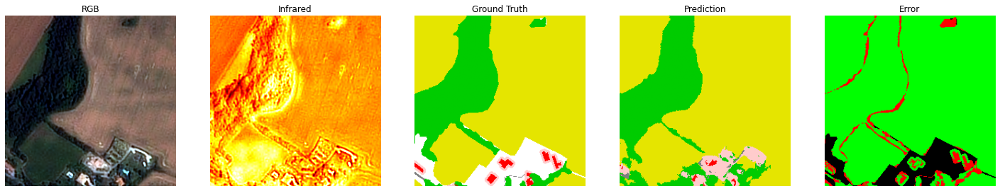

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 47.37%  |  Water : 84.26%  |  Fields : 89.26%  |  Road : 44.22%  |  Vegetation : 73.00%  |  Buildings : 38.93%
Epoch   6 -> Overall Accuracy: 84.97% mIoU : 62.84% Acc Loss: 0.4132 TV Loss: 1.3610 Loss: 0.4148


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 48.27%  |  Water : 83.12%  |  Fields : 88.28%  |  Road : 46.21%  |  Vegetation : 71.07%  |  Buildings : 40.80%
Epoch   7 -> Overall Accuracy: 84.75% mIoU : 62.96% Acc Loss: 0.4248 TV Loss: 1.2832 Loss: 0.4266


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 48.91%  |  Water : 85.68%  |  Fields : 89.97%  |  Road : 46.81%  |  Vegetation : 73.66%  |  Buildings : 42.33%
Epoch   8 -> Overall Accuracy: 85.78% mIoU : 64.56% Acc Loss: 0.3988 TV Loss: 1.3151 Loss: 0.4009


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 49.02%  |  Water : 86.16%  |  Fields : 91.61%  |  Road : 45.62%  |  Vegetation : 74.80%  |  Buildings : 43.06%
Epoch   9 -> Overall Accuracy: 86.42% mIoU : 65.05% Acc Loss: 0.3816 TV Loss: 1.3351 Loss: 0.3840


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 50.83%  |  Water : 85.87%  |  Fields : 90.49%  |  Road : 47.51%  |  Vegetation : 74.46%  |  Buildings : 44.20%
Epoch  10 -> Overall Accuracy: 86.43% mIoU : 65.56% Acc Loss: 0.3772 TV Loss: 1.3058 Loss: 0.3798


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 48.21%  |  Water : 89.68%  |  Fields : 91.87%  |  Road : 44.15%  |  Vegetation : 76.56%  |  Buildings : 45.93%
Epoch  10 -> Overall Accuracy: 86.50% mIoU : 66.06% Acc Loss: 0.4317 TV Loss: 1.4526 Loss: 0.4346


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


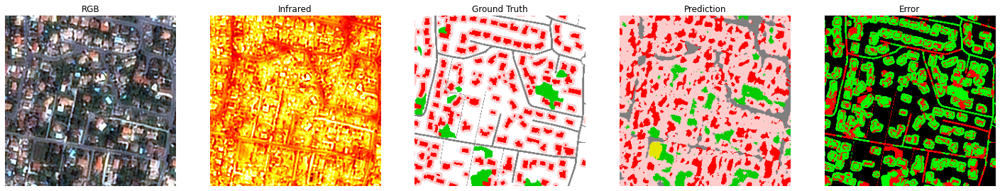

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 50.64%  |  Water : 85.21%  |  Fields : 91.16%  |  Road : 49.24%  |  Vegetation : 74.11%  |  Buildings : 44.73%
Epoch  11 -> Overall Accuracy: 86.70% mIoU : 65.85% Acc Loss: 0.3740 TV Loss: 1.2494 Loss: 0.3767


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.67%  |  Water : 84.18%  |  Fields : 91.51%  |  Road : 46.88%  |  Vegetation : 76.62%  |  Buildings : 44.67%
Epoch  12 -> Overall Accuracy: 87.09% mIoU : 65.92% Acc Loss: 0.3600 TV Loss: 1.2089 Loss: 0.3629


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.28%  |  Water : 85.61%  |  Fields : 92.28%  |  Road : 50.25%  |  Vegetation : 77.23%  |  Buildings : 46.90%
Epoch  13 -> Overall Accuracy: 87.69% mIoU : 67.42% Acc Loss: 0.3487 TV Loss: 1.2554 Loss: 0.3520


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.13%  |  Water : 85.52%  |  Fields : 92.22%  |  Road : 49.07%  |  Vegetation : 76.53%  |  Buildings : 46.94%
Epoch  14 -> Overall Accuracy: 87.62% mIoU : 67.07% Acc Loss: 0.3480 TV Loss: 1.2352 Loss: 0.3514


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.07%  |  Water : 84.03%  |  Fields : 91.74%  |  Road : 50.75%  |  Vegetation : 75.85%  |  Buildings : 49.25%
Epoch  15 -> Overall Accuracy: 87.63% mIoU : 67.62% Acc Loss: 0.3445 TV Loss: 1.2079 Loss: 0.3481


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.30%  |  Water : 90.72%  |  Fields : 89.64%  |  Road : 48.48%  |  Vegetation : 72.91%  |  Buildings : 48.73%
Epoch  15 -> Overall Accuracy: 86.35% mIoU : 67.13% Acc Loss: 0.4224 TV Loss: 1.2188 Loss: 0.4261


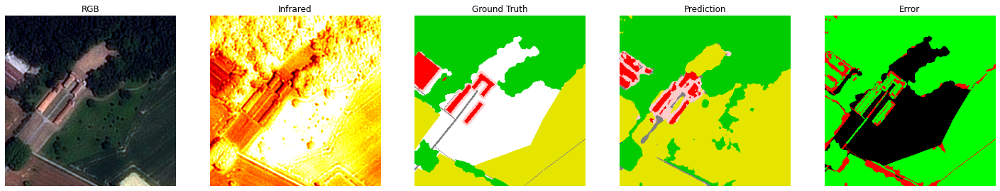

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.00%  |  Water : 83.59%  |  Fields : 90.79%  |  Road : 46.35%  |  Vegetation : 74.63%  |  Buildings : 46.46%
Epoch  16 -> Overall Accuracy: 86.74% mIoU : 65.80% Acc Loss: 0.3737 TV Loss: 1.1914 Loss: 0.3775


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.26%  |  Water : 83.60%  |  Fields : 90.96%  |  Road : 49.83%  |  Vegetation : 75.25%  |  Buildings : 47.78%
Epoch  17 -> Overall Accuracy: 86.97% mIoU : 66.45% Acc Loss: 0.3730 TV Loss: 1.1909 Loss: 0.3770


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.60%  |  Water : 83.06%  |  Fields : 91.37%  |  Road : 51.20%  |  Vegetation : 75.68%  |  Buildings : 48.68%
Epoch  18 -> Overall Accuracy: 87.26% mIoU : 67.10% Acc Loss: 0.3635 TV Loss: 1.2577 Loss: 0.3680


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 52.32%  |  Water : 85.53%  |  Fields : 89.42%  |  Road : 49.18%  |  Vegetation : 73.52%  |  Buildings : 48.17%
Epoch  19 -> Overall Accuracy: 86.43% mIoU : 66.36% Acc Loss: 0.3865 TV Loss: 1.1503 Loss: 0.3909


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.14%  |  Water : 84.51%  |  Fields : 91.69%  |  Road : 50.47%  |  Vegetation : 77.54%  |  Buildings : 47.36%
Epoch  20 -> Overall Accuracy: 87.72% mIoU : 67.45% Acc Loss: 0.3564 TV Loss: 1.1411 Loss: 0.3610


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 50.58%  |  Water : 90.48%  |  Fields : 92.35%  |  Road : 47.68%  |  Vegetation : 77.68%  |  Buildings : 43.26%
Epoch  20 -> Overall Accuracy: 87.58% mIoU : 67.00% Acc Loss: 0.4069 TV Loss: 1.1920 Loss: 0.4117


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


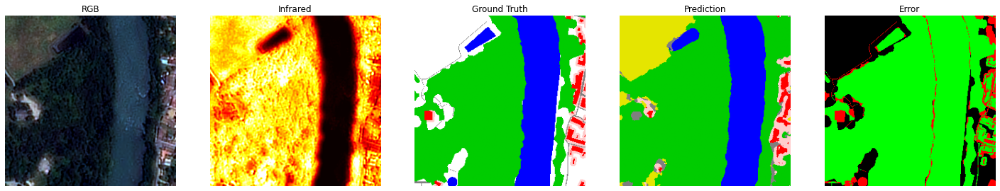

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.92%  |  Water : 83.02%  |  Fields : 92.12%  |  Road : 48.84%  |  Vegetation : 74.79%  |  Buildings : 49.31%
Epoch  21 -> Overall Accuracy: 87.15% mIoU : 66.66% Acc Loss: 0.3631 TV Loss: 1.1813 Loss: 0.3680


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.01%  |  Water : 81.70%  |  Fields : 91.31%  |  Road : 50.05%  |  Vegetation : 75.37%  |  Buildings : 49.25%
Epoch  22 -> Overall Accuracy: 87.28% mIoU : 66.78% Acc Loss: 0.3577 TV Loss: 1.1253 Loss: 0.3627


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.82%  |  Water : 78.52%  |  Fields : 91.49%  |  Road : 51.07%  |  Vegetation : 76.38%  |  Buildings : 50.25%
Epoch  23 -> Overall Accuracy: 87.53% mIoU : 66.92% Acc Loss: 0.3581 TV Loss: 1.1019 Loss: 0.3632


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 54.60%  |  Water : 79.49%  |  Fields : 92.65%  |  Road : 51.50%  |  Vegetation : 76.76%  |  Buildings : 48.76%
Epoch  24 -> Overall Accuracy: 87.95% mIoU : 67.30% Acc Loss: 0.3476 TV Loss: 1.0662 Loss: 0.3527


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.71%  |  Water : 85.33%  |  Fields : 90.24%  |  Road : 50.42%  |  Vegetation : 75.18%  |  Buildings : 49.83%
Epoch  25 -> Overall Accuracy: 86.94% mIoU : 67.45% Acc Loss: 0.3831 TV Loss: 1.1761 Loss: 0.3890


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 51.39%  |  Water : 86.91%  |  Fields : 92.92%  |  Road : 42.81%  |  Vegetation : 76.38%  |  Buildings : 42.16%
Epoch  25 -> Overall Accuracy: 86.81% mIoU : 65.43% Acc Loss: 0.4280 TV Loss: 1.1922 Loss: 0.4339


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


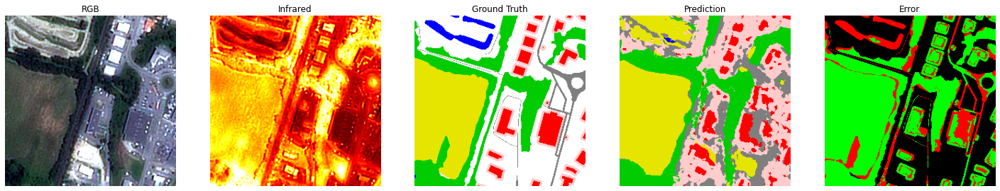

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.51%  |  Water : 84.42%  |  Fields : 92.12%  |  Road : 51.97%  |  Vegetation : 77.36%  |  Buildings : 49.98%
Epoch  26 -> Overall Accuracy: 88.14% mIoU : 68.56% Acc Loss: 0.3372 TV Loss: 1.1086 Loss: 0.3430


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.65%  |  Water : 85.36%  |  Fields : 92.99%  |  Road : 49.95%  |  Vegetation : 78.69%  |  Buildings : 50.30%
Epoch  27 -> Overall Accuracy: 88.50% mIoU : 68.82% Acc Loss: 0.3249 TV Loss: 1.1188 Loss: 0.3309


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.68%  |  Water : 85.62%  |  Fields : 93.65%  |  Road : 54.22%  |  Vegetation : 78.79%  |  Buildings : 52.30%
Epoch  28 -> Overall Accuracy: 89.17% mIoU : 70.21% Acc Loss: 0.3066 TV Loss: 1.0825 Loss: 0.3127


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.86%  |  Water : 85.10%  |  Fields : 92.62%  |  Road : 56.33%  |  Vegetation : 77.45%  |  Buildings : 53.79%
Epoch  29 -> Overall Accuracy: 88.80% mIoU : 70.36% Acc Loss: 0.3250 TV Loss: 1.1083 Loss: 0.3314


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.02%  |  Water : 84.26%  |  Fields : 93.13%  |  Road : 49.66%  |  Vegetation : 77.74%  |  Buildings : 49.76%
Epoch  30 -> Overall Accuracy: 88.61% mIoU : 68.59% Acc Loss: 0.3245 TV Loss: 1.1107 Loss: 0.3312


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.20%  |  Water : 90.70%  |  Fields : 93.75%  |  Road : 47.69%  |  Vegetation : 80.57%  |  Buildings : 47.80%
Epoch  30 -> Overall Accuracy: 88.64% mIoU : 69.28% Acc Loss: 0.3676 TV Loss: 1.0945 Loss: 0.3742


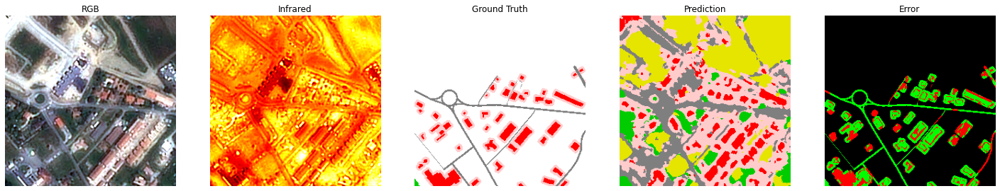

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.94%  |  Water : 85.29%  |  Fields : 92.66%  |  Road : 54.05%  |  Vegetation : 77.50%  |  Buildings : 51.56%
Epoch  31 -> Overall Accuracy: 88.50% mIoU : 69.67% Acc Loss: 0.3224 TV Loss: 1.0575 Loss: 0.3289


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.23%  |  Water : 85.34%  |  Fields : 91.97%  |  Road : 55.99%  |  Vegetation : 77.04%  |  Buildings : 53.02%
Epoch  32 -> Overall Accuracy: 88.56% mIoU : 70.10% Acc Loss: 0.3286 TV Loss: 1.0748 Loss: 0.3354


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.72%  |  Water : 85.06%  |  Fields : 92.18%  |  Road : 53.52%  |  Vegetation : 77.21%  |  Buildings : 52.12%
Epoch  33 -> Overall Accuracy: 88.28% mIoU : 69.30% Acc Loss: 0.3329 TV Loss: 1.0657 Loss: 0.3399


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 56.92%  |  Water : 84.05%  |  Fields : 92.65%  |  Road : 53.54%  |  Vegetation : 77.48%  |  Buildings : 52.19%
Epoch  34 -> Overall Accuracy: 88.61% mIoU : 69.47% Acc Loss: 0.3257 TV Loss: 1.0676 Loss: 0.3329


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.85%  |  Water : 84.17%  |  Fields : 92.40%  |  Road : 54.18%  |  Vegetation : 77.51%  |  Buildings : 52.96%
Epoch  35 -> Overall Accuracy: 88.63% mIoU : 69.84% Acc Loss: 0.3280 TV Loss: 1.0725 Loss: 0.3355


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.17%  |  Water : 90.72%  |  Fields : 91.99%  |  Road : 40.08%  |  Vegetation : 79.23%  |  Buildings : 48.07%
Epoch  35 -> Overall Accuracy: 87.77% mIoU : 67.54% Acc Loss: 0.3792 TV Loss: 1.0669 Loss: 0.3866


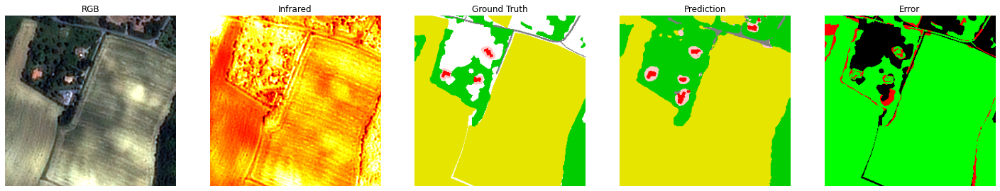

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.66%  |  Water : 85.68%  |  Fields : 93.37%  |  Road : 55.05%  |  Vegetation : 79.21%  |  Buildings : 53.41%
Epoch  36 -> Overall Accuracy: 89.32% mIoU : 70.73% Acc Loss: 0.3143 TV Loss: 1.0691 Loss: 0.3220


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.30%  |  Water : 85.89%  |  Fields : 93.19%  |  Road : 56.13%  |  Vegetation : 78.03%  |  Buildings : 52.44%
Epoch  37 -> Overall Accuracy: 89.06% mIoU : 70.50% Acc Loss: 0.3100 TV Loss: 1.0336 Loss: 0.3177


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.84%  |  Water : 85.36%  |  Fields : 92.54%  |  Road : 58.22%  |  Vegetation : 77.21%  |  Buildings : 54.99%
Epoch  38 -> Overall Accuracy: 89.13% mIoU : 71.19% Acc Loss: 0.3084 TV Loss: 1.0524 Loss: 0.3164


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.02%  |  Water : 85.92%  |  Fields : 92.09%  |  Road : 56.90%  |  Vegetation : 76.93%  |  Buildings : 54.75%
Epoch  39 -> Overall Accuracy: 88.90% mIoU : 70.94% Acc Loss: 0.3150 TV Loss: 1.0124 Loss: 0.3229


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.93%  |  Water : 85.39%  |  Fields : 92.77%  |  Road : 54.44%  |  Vegetation : 78.26%  |  Buildings : 52.74%
Epoch  40 -> Overall Accuracy: 89.03% mIoU : 70.42% Acc Loss: 0.3110 TV Loss: 1.0187 Loss: 0.3191


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 53.84%  |  Water : 90.69%  |  Fields : 93.38%  |  Road : 37.28%  |  Vegetation : 80.15%  |  Buildings : 50.69%
Epoch  40 -> Overall Accuracy: 88.31% mIoU : 67.67% Acc Loss: 0.3753 TV Loss: 1.0310 Loss: 0.3836


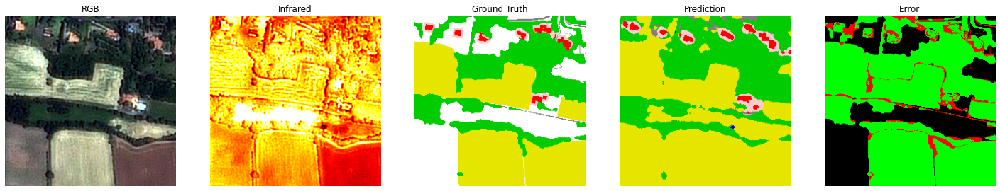

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.82%  |  Water : 86.68%  |  Fields : 93.71%  |  Road : 54.41%  |  Vegetation : 79.61%  |  Buildings : 53.81%
Epoch  41 -> Overall Accuracy: 89.75% mIoU : 71.18% Acc Loss: 0.2873 TV Loss: 1.0060 Loss: 0.2956


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.00%  |  Water : 85.63%  |  Fields : 92.00%  |  Road : 56.54%  |  Vegetation : 77.27%  |  Buildings : 55.24%
Epoch  42 -> Overall Accuracy: 88.90% mIoU : 70.95% Acc Loss: 0.3173 TV Loss: 1.0320 Loss: 0.3259


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.91%  |  Water : 84.13%  |  Fields : 92.35%  |  Road : 55.43%  |  Vegetation : 76.76%  |  Buildings : 51.68%
Epoch  43 -> Overall Accuracy: 88.66% mIoU : 69.71% Acc Loss: 0.3255 TV Loss: 1.0670 Loss: 0.3347


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.71%  |  Water : 84.92%  |  Fields : 92.45%  |  Road : 57.35%  |  Vegetation : 77.74%  |  Buildings : 54.48%
Epoch  44 -> Overall Accuracy: 88.93% mIoU : 70.78% Acc Loss: 0.3190 TV Loss: 1.0066 Loss: 0.3278


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.47%  |  Water : 85.62%  |  Fields : 93.27%  |  Road : 58.11%  |  Vegetation : 78.65%  |  Buildings : 55.38%
Epoch  45 -> Overall Accuracy: 89.40% mIoU : 71.75% Acc Loss: 0.3004 TV Loss: 0.9961 Loss: 0.3094


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 57.12%  |  Water : 90.63%  |  Fields : 93.57%  |  Road : 52.55%  |  Vegetation : 80.10%  |  Buildings : 53.26%
Epoch  45 -> Overall Accuracy: 89.30% mIoU : 71.21% Acc Loss: 0.3430 TV Loss: 1.0084 Loss: 0.3521


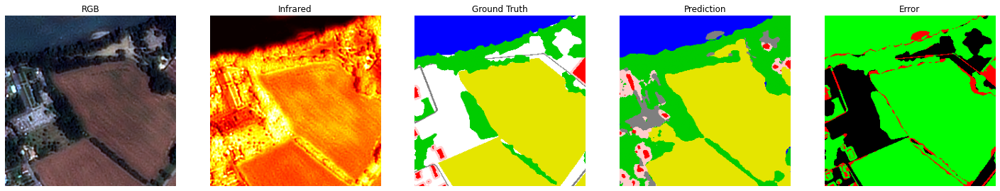

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.72%  |  Water : 86.07%  |  Fields : 93.47%  |  Road : 59.72%  |  Vegetation : 77.95%  |  Buildings : 56.17%
Epoch  46 -> Overall Accuracy: 89.62% mIoU : 72.18% Acc Loss: 0.2989 TV Loss: 1.0043 Loss: 0.3081


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 58.84%  |  Water : 85.96%  |  Fields : 92.53%  |  Road : 59.73%  |  Vegetation : 77.97%  |  Buildings : 56.39%
Epoch  47 -> Overall Accuracy: 89.40% mIoU : 71.90% Acc Loss: 0.3020 TV Loss: 0.9613 Loss: 0.3110


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.69%  |  Water : 85.36%  |  Fields : 93.55%  |  Road : 62.45%  |  Vegetation : 78.89%  |  Buildings : 57.01%
Epoch  48 -> Overall Accuracy: 90.05% mIoU : 72.83% Acc Loss: 0.2857 TV Loss: 1.0037 Loss: 0.2953


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 59.46%  |  Water : 85.80%  |  Fields : 92.99%  |  Road : 61.14%  |  Vegetation : 78.64%  |  Buildings : 56.40%
Epoch  49 -> Overall Accuracy: 89.65% mIoU : 72.41% Acc Loss: 0.2946 TV Loss: 1.0029 Loss: 0.3044


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|                                                                                                         …

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:749: UserWarning:


Urban : 55.47%  |  Water : 90.58%  |  Fields : 94.19%  |  Road : 55.63%  |  Vegetation : 80.94%  |  Buildings : 56.49%
Epoch  49 -> Overall Accuracy: 89.65% mIoU : 72.21% Acc Loss: 0.3321 TV Loss: 0.9926 Loss: 0.3418


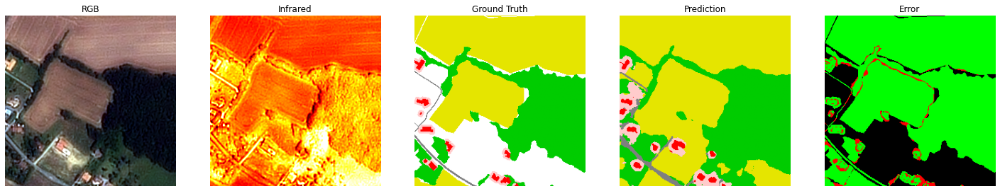

In [34]:
#[19]
args = mock.Mock() #stores the parameters
args.n_epoch = 50
args.n_epoch_test = int(5) #periodicity of evaluation on test set
args.batch_size = 16
args.n_class = 6
args.n_channel = 4
args.conv_width = [16,16,32,32,64,32]
args.dconv_width = [32,16,32,16]
args.cuda = 1
args.lr = 5e-3
args.weight_TV_base = 0.01

trained_model = train_full_TV(args)


tensor([[ 0.7176,  0.7176, -1.5413,  ..., -0.2114, -0.3999, -1.7440],
        [ 1.5388,  1.5388,  1.2299,  ...,  0.4519,  0.1451,  0.1614],
        [-0.7143, -0.7143,  1.3275,  ...,  0.2369, -0.0365, -1.3332],
        [ 1.4224,  1.4224,  2.0294,  ...,  0.3552,  0.7275,  0.8631],
        [-0.9654, -0.9654, -1.9819,  ..., -1.4250, -0.7820, -1.9188],
        [ 3.9883,  3.9883,  2.6617,  ..., -0.5440, -0.2306,  0.2878]],
       device='cuda:0', grad_fn=<IndexBackward>)

tensor([[-0.3751, -1.5413, -0.8661,  ..., -0.3999, -1.7440, -1.0470],
        [ 0.7389,  1.2299, -0.0619,  ...,  0.1451,  0.1614,  0.3746],
        [-0.4907,  1.3275, -1.0962,  ..., -0.0365, -1.3332, -0.9534],
        [ 1.2643,  2.0294,  1.8264,  ...,  0.7275,  0.8631,  1.0519],
        [ 0.5500, -1.9819, -4.0762,  ..., -0.7820, -1.9188, -0.4773],
        [ 4.5485,  2.6617,  1.3380,  ..., -0.2306,  0.2878, -0.4462]],
       device='cuda:0', grad_fn=<IndexBackward>)

tensor([[ 4.3498,  7.5598,  8.0115,  ...,  2.0973,  4.4480,  3.6542],
        [15.2632, 16.7302, 12.2340,  ...,  5.5881,  5.4696,  3.4606],
        [ 4.5137, 10.8630,  9.7486,  ...,  3.0745,  3.3004,  2.4650],
        ...,
        [ 5.0148,  9.6321, 11.6186,  ...,  9.8220,  6.7682,  8.6346],
        [14.0099,  5.7326, 10.8367,  ...,  2.3930,  6.1989,  3.0217],
        [ 4.8473, 10.5787,  8.6921,  ...,  8.2676,  5.7679,  6.0617]],
       device='cuda:0', grad_fn=<SumBackward1>)

In [ ]:
class ConvDiscriminator(nn.Module):
  """
  Convolutional Discriminator
  """
  
  def __init__(self, n_channels, conv_width, fnet_width, size_of_last_fmap = 4, cuda = 1):
    """
    initialization function
    n_channels, int, number of input channel
    conv_width, int list, size of the featuremap of convs
    fnet_width, int list, size of the fully connected net
    input_feat = int, number of input feature
    subsample_size = int, number of points to which the tiles are subsampled
    
    """
    super(ConvDiscriminator, self).__init__() #necessary for all classes extending the module class
       
    self.maxpool=nn.MaxPool2d(2,2,return_indices=False) #maxpooling layer    

    self.c1= nn.Sequential(nn.Conv2d(n_channels,conv_width[0],3,padding=1, padding_mode='reflection'),nn.BatchNorm2d(conv_width[0]),nn.ReLU(True))
    self.c2= nn.Sequential(nn.Conv2d(conv_width[0],conv_width[1],3,padding=1, padding_mode='reflection'),nn.BatchNorm2d(conv_width[1]),nn.ReLU(True))
    self.c3= nn.Sequential(nn.Conv2d(conv_width[1],conv_width[2],3,padding=1, padding_mode='reflection'),nn.BatchNorm2d(conv_width[2]),nn.ReLU(True))
    self.c4= nn.Sequential(nn.Conv2d(conv_width[2],conv_width[3],3,padding=1, padding_mode='reflection'),nn.BatchNorm2d(conv_width[3]),nn.ReLU(True))
    self.c5= nn.Sequential(nn.Conv2d(conv_width[3],conv_width[4],3,padding=1, padding_mode='reflection'),nn.BatchNorm2d(conv_width[4]),nn.ReLU(True))
    self.c6= nn.Sequential(nn.Conv2d(conv_width[4],conv_width[5],3,padding=1, padding_mode='reflection'),nn.BatchNorm2d(conv_width[5]),nn.ReLU(True))

    self.fc1=nn.Sequential(nn.Linear(size_of_last_fmap**2 * conv_width[5], fnet_width[0]),nn.BatchNorm1d(fnet_width[0]),nn.ReLU(True))
    self.fc2=nn.Sequential(nn.Linear(fnet_width[0], fnet_width[1]),nn.BatchNorm1d(fnet_width[1]),nn.ReLU(True))
    #final decoding layer
    self.classifier=nn.Linear(fnet_width[1],2)

    #weight initialization
    self.c1[0].apply(self.init_weights)
    self.c2[0].apply(self.init_weights)
    self.c3[0].apply(self.init_weights)
    self.c4[0].apply(self.init_weights)
    self.c5[0].apply(self.init_weights)
    self.c6[0].apply(self.init_weights)
    self.fc1[0].apply(self.init_weights)
    self.fc2[0].apply(self.init_weights)
    self.classifier.apply(self.init_weights)
    
    if cuda:
      self.cuda()
    
  def init_weights(self,layer): #gaussian init for the conv layers
    nn.init.kaiming_normal_(layer.weight, mode='fan_out', nonlinearity='relu')
    
  def forward(self,input):
      
    #level 1
    x = self.c1(input)
    x = self.maxpool(x)

    x = self.c2(x)
    x = self.maxpool(x) 

    x = self.c3(x)
    x = self.maxpool(x) 

    x = self.c4(x)
    x = self.maxpool(x) 

    x = self.c5(x)
    x = self.maxpool(x) 

    x = self.c6(x)
    x = self.maxpool(x)  

    x = x.view(x.size(0), x.size(1) * x.size(2) * x.size(3))
    x = self.fc2(self.fc1(x))
    out = self.classifier(x)
    return torch.tanh(out)

In [ ]:

model = SegNet(4,[16,16,32,32,64,32],[32,16,32,16], 6)
convd = ConvDiscriminator(6, [8,8,16,16,16,32],[128,32], size_of_last_fmap = 4)

optimizerC = optim.Adam(model.parameters(), lr=0.01, betas=(0.9, 0.999))
optimizerD = optim.Adam(convd.parameters(), lr=0.01, betas=(0.9, 0.999))

loader = torch.utils.data.DataLoader(train_set, \
         batch_size=8, shuffle=True, drop_last=True)

for index, (tiles, gt) in enumerate(loader):
  break

mask = gt.eq(99)
gt_ = gt.clone()
gt_[mask] = 0
gt_one_hot = torch.eye(6)[gt_].permute(0,3,1,2)
gt_one_hot[mask[:,None,:,:].repeat(1,6, 1,1)] = 0    
    
pred = model(tiles) #compute the prediction
pred[mask[:,None,:,:].repeat(1,6, 1,1)] = 0
pred_fake = torch.cat((convd(pred),convd(gt_one_hot.cuda())),0)
gt_fake = torch.zeros(pred_fake.shape[0]).long()
gt_fake[:pred.shape[0]] = 1

loss_class = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)
loss_disc  = nn.functional.cross_entropy(pred_fake.cpu(),gt_fake)

loss = loss_class - loss_disc

loss.backward()

optimizerC.step()
optimizerD.step()


In [ ]:
#[11]
def train_CD(modelC, modelD, optimizerC, optimizerD, epoch, args):
  """train for one epoch"""
  model.train() #switch the model in training mode
  
  #the loader function will take care of the batching
  loader = torch.utils.data.DataLoader(train_set, \
         batch_size=args.batch_size, shuffle=True, drop_last=True)
  #tqdm will provide some nice progress bars
  loader = tqdm(loader, ncols=500)
  
  #will keep track of the loss
  lossC_meter = tnt.meter.AverageValueMeter()
  lossD_meter = tnt.meter.AverageValueMeter()
  loss_meter = tnt.meter.AverageValueMeter()
  cmC = ConfusionMatrix(args.n_class, class_names = class_names)
  cmD = ConfusionMatrix(args.n_class, class_names = ['real', 'fake'])

  for index, (tiles, gt) in enumerate(loader):
    
    optimizerC.zero_grad() #put gradient to zero
    optimizerD.zero_grad() #put gradient to zero

    mask = gt.eq(99)
    mask_ = mask[:,None,:,:].repeat(1,6, 1,1)
    gt_ = gt.clone()
    gt_[mask] = 0
    gt_one_hot = torch.eye(6)[gt_].permute(0,3,1,2)
    gt_one_hot[mask_] = 0    
        
    pred = modelC(tiles) #compute the prediction
    pred[mask_] = 0
    pred_fake = torch.cat((modelD(pred),modelD(gt_one_hot.cuda())),0)
    gt_fake = torch.zeros(pred_fake.shape[0]).long()
    gt_fake[:pred.shape[0]] = 1

    lossC = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)
    lossD  = nn.functional.cross_entropy(pred_fake.cpu(),gt_fake)

    loss = lossC - lossD * (epoch / (args.n_epoch + 0.01))

    loss.backward()

    for p in modelC.parameters(): #we clip the gradient at norm 1
      p.grad.data.clamp_(-1, 1)
    for p in modelD.parameters(): #we clip the gradient at norm 1
      p.grad.data.clamp_(-1, 1)

    optimizerC.step()
    optimizerD.step()
    
    lossC_meter.add(lossC.item())
    lossD_meter.add(lossD.item())
    loss_meter.add(loss.item())

    labeled = np.where(gt.view(-1)!=99)[0] #select gt with a label
    #need to put the prediction back on the cpu and convert to numpy
    cmC.add_batch(gt.view(-1)[labeled], pred.argmax(1).view(-1)[labeled].cpu().detach().numpy())
    cmD.add_batch(gt_fake.view(-1), pred_fake.argmax(1).view(-1).cpu().detach().numpy())
    
  return cmC, cmD, lossC_meter.value()[0], lossD_meter.value()[0], loss_meter.value()[0]

def eval_CD(modelC, modelD, epoch, args):
  """eval on test/validation set"""
  
  model.eval() #switch in eval mode
  
  loader = torch.utils.data.DataLoader(test_set, batch_size=8, shuffle=False, drop_last=False)
  
  loader = tqdm(loader, ncols=500)
  
    #will keep track of the loss
  lossC_meter = tnt.meter.AverageValueMeter()
  lossD_meter = tnt.meter.AverageValueMeter()
  loss_meter = tnt.meter.AverageValueMeter()
  cmC = ConfusionMatrix(args.n_class, class_names = class_names)
  cmD = ConfusionMatrix(args.n_class, class_names = ['real', 'fake'])

  with torch.no_grad():
    for index, (tiles, gt) in enumerate(loader):

      mask = gt.eq(99)
      mask_ = mask[:,None,:,:].repeat(1,6, 1,1)
      gt_ = gt.clone()
      gt_[mask] = 0
      gt_one_hot = torch.eye(6)[gt_].permute(0,3,1,2)
      gt_one_hot[mask_] = 0    
          
      pred = modelC(tiles) #compute the prediction
      pred[mask_] = 0
      pred_fake = torch.cat((modelD(pred),modelD(gt_one_hot.cuda())),0)
      gt_fake = torch.zeros(pred_fake.shape[0]).long()
      gt_fake[:pred.shape[0]] = 1

      lossC = nn.functional.cross_entropy(pred.cpu(),gt, ignore_index=99)
      lossD  = nn.functional.cross_entropy(pred_fake.cpu(),gt_fake)

      loss = lossC - lossD * (epoch / (args.n_epoch + 0.01))
    
      lossC_meter.add(lossC.item())
      lossD_meter.add(lossD.item())
      loss_meter.add(loss.item())

      labeled = np.where(gt.view(-1)!=99)[0] #select gt with a label
      #need to put the prediction back on the cpu and convert to numpy
      cmC.add_batch(gt.view(-1)[labeled], pred.argmax(1).view(-1)[labeled].cpu().detach().numpy())
      cmD.add_batch(gt_fake.view(-1), pred_fake.argmax(1).view(-1).cpu().detach().numpy())
  return cmC, cmD, lossC_meter.value()[0], lossD_meter.value()[0], loss_meter.value()[0]

def train_full_CD(args):
  """The full training loop"""
  #initialize the model
  
  model = SegNet(4,[16,16,32,32,64,32],[32,16,32,16], 6)
  convd = ConvDiscriminator(6, [8,8,16,16,16,32],[128,32], size_of_last_fmap = 4)

  optimizerC = optim.Adam(model.parameters(), lr=0.01, betas=(0.9, 0.999))
  optimizerD = optim.Adam(convd.parameters(), lr=0.01, betas=(0.9, 0.999))

  print('Total number of parameters: {}'.format(sum([p.numel() for p in model.parameters()])))
  print('Total number of parameters: {}'.format(sum([p.numel() for p in convd.parameters()])))

  #print(model)
  
  #define the optimizer
  #adam optimizer is always a good guess for classification
  optimizer = optim.Adam(model.parameters(), lr=args.lr)
  
  TESTCOLOR = '\033[104m'
  TRAINCOLOR = '\033[100m'
  NORMALCOLOR = '\033[0m'
  
  for i_epoch in range(args.n_epoch):
    #train one epoch
    cmC, cmD, lossC, lossD, loss = train_CD(model, convd, optimizerC, optimizerD, i_epoch, args)
    print(TRAINCOLOR)
    print('Epoch %3d -> Train Overall Accuracy: %3.2f%% Train mIoU : %3.2f%% Train Loss: %1.4f' % (i_epoch, cmC.overall_accuracy(), cmC.class_IoU(), loss))
    print('          -> lossC: %1.4f lossD: %1.4f DOA % 3.2f%%'% (lossC, lossD, cmD.overall_accuracy()) + NORMALCOLOR)
    if (i_epoch == args.n_epoch - 1) or (args.n_epoch_test != 0 and i_epoch % args.n_epoch_test == 0 and i_epoch > 0):
      #periodic testing
      cmC, cmD, lossC, lossD, loss = eval_CD(model, convd, i_epoch, args)
      print(TESTCOLOR)
      print('Epoch %3d -> Train Overall Accuracy: %3.2f%% Train mIoU : %3.2f%% Train Loss: %1.4f' % (i_epoch, cmC.overall_accuracy(), cmC.class_IoU(), loss))
      print('          -> lossC: %1.4f lossD: %1.4f DOA % 3.2f%%'% (lossC, lossD, cmD.overall_accuracy()) + NORMALCOLOR)
      viewer(n_shown = 1, train = False, model = model, category = 'cigpe')
  return modelC, modelD

Total number of parameters: 92166
Total number of parameters: 81842



Urban : 22.90%  |  Water : 35.72%  |  Fields : 67.37%  |  Road : 4.28%  |  Vegetation : 59.75%  |  Buildings : 7.11%
Epoch   0 -> Train Overall Accuracy: 67.42% Train mIoU : 32.85% Train Loss: 0.9920
          -> lossC: 0.9920 lossD: 0.8294 DOA  44.79%



Urban : 35.30%  |  Water : 75.92%  |  Fields : 80.04%  |  Road : 21.89%  |  Vegetation : 67.35%  |  Buildings : 14.53%
Epoch   1 -> Train Overall Accuracy: 77.49% Train mIoU : 49.17% Train Loss: 0.6371
          -> lossC: 0.6461 lossD: 0.8989 DOA  51.30%



Urban : 42.13%  |  Water : 74.40%  |  Fields : 86.04%  |  Road : 29.09%  |  Vegetation : 70.11%  |  Buildings : 22.09%
Epoch   2 -> Train Overall Accuracy: 81.04% Train mIoU : 53.98% Train Loss: 0.5001
          -> lossC: 0.5233 lossD: 1.1562 DOA  44.01%



Urban : 39.38%  |  Water : 77.44%  |  Fields : 82.88%  |  Road : 35.72%  |  Vegetation : 67.49%  |  Buildings : 23.84%
Epoch   3 -> Train Overall Accuracy: 80.33% Train mIoU : 54.46% Train Loss: 0.5320
          -> lossC: 0.5683 lossD: 1.2107 DOA  41.93%



Urban : 42.03%  |  Water : 79.07%  |  Fields : 86.85%  |  Road : 37.56%  |  Vegetation : 69.55%  |  Buildings : 26.81%
Epoch   4 -> Train Overall Accuracy: 82.07% Train mIoU : 56.98% Train Loss: 0.4426
          -> lossC: 0.4927 lossD: 1.2533 DOA  42.45%



Urban : 43.62%  |  Water : 81.14%  |  Fields : 86.77%  |  Road : 41.36%  |  Vegetation : 70.66%  |  Buildings : 29.95%
Epoch   5 -> Train Overall Accuracy: 82.75% Train mIoU : 58.92% Train Loss: 0.4135
          -> lossC: 0.4812 lossD: 1.3532 DOA  35.68%



Urban : 36.93%  |  Water : 85.72%  |  Fields : 81.72%  |  Road : 34.35%  |  Vegetation : 73.81%  |  Buildings : 25.64%
Epoch   5 -> Train Overall Accuracy: 80.97% Train mIoU : 56.36% Train Loss: 0.5024
          -> lossC: 0.5740 lossD: 1.4324 DOA  32.50%


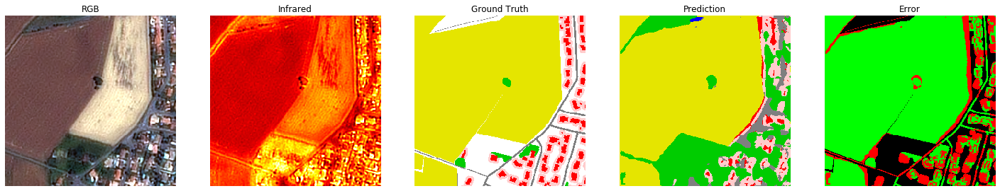


Urban : 43.57%  |  Water : 81.43%  |  Fields : 87.81%  |  Road : 43.54%  |  Vegetation : 71.50%  |  Buildings : 31.69%
Epoch   6 -> Train Overall Accuracy: 83.71% Train mIoU : 59.92% Train Loss: 0.3779
          -> lossC: 0.4571 lossD: 1.3203 DOA  38.28%



Urban : 44.00%  |  Water : 83.08%  |  Fields : 87.91%  |  Road : 43.67%  |  Vegetation : 71.47%  |  Buildings : 32.30%
Epoch   7 -> Train Overall Accuracy: 83.59% Train mIoU : 60.40% Train Loss: 0.3608
          -> lossC: 0.4588 lossD: 1.3993 DOA  32.03%



Urban : 46.05%  |  Water : 83.29%  |  Fields : 89.25%  |  Road : 43.01%  |  Vegetation : 73.08%  |  Buildings : 35.42%
Epoch   8 -> Train Overall Accuracy: 84.61% Train mIoU : 61.68% Train Loss: 0.3070
          -> lossC: 0.4270 lossD: 1.4996 DOA  29.69%



Urban : 45.84%  |  Water : 83.62%  |  Fields : 89.26%  |  Road : 42.72%  |  Vegetation : 73.16%  |  Buildings : 32.83%
Epoch   9 -> Train Overall Accuracy: 84.37% Train mIoU : 61.24% Train Loss: 0.2857
          -> lossC: 0.4307 lossD: 1.6109 DOA  23.18%



Urban : 46.07%  |  Water : 83.95%  |  Fields : 87.40%  |  Road : 44.37%  |  Vegetation : 70.30%  |  Buildings : 34.66%
Epoch  10 -> Train Overall Accuracy: 83.46% Train mIoU : 61.12% Train Loss: 0.2900
          -> lossC: 0.4539 lossD: 1.6388 DOA  23.70%



Urban : 40.90%  |  Water : 85.08%  |  Fields : 81.28%  |  Road : 30.76%  |  Vegetation : 73.34%  |  Buildings : 27.78%
Epoch  10 -> Train Overall Accuracy: 80.01% Train mIoU : 56.52% Train Loss: 0.4494
          -> lossC: 0.5911 lossD: 1.4171 DOA  33.00%


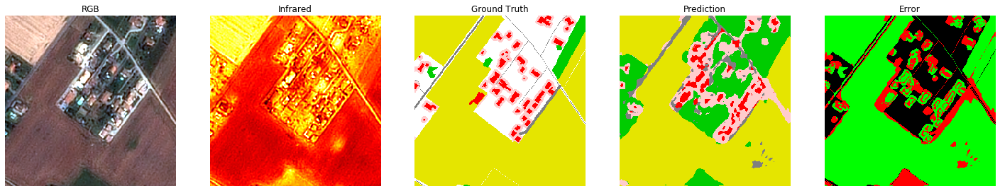


Urban : 46.47%  |  Water : 85.82%  |  Fields : 87.94%  |  Road : 46.07%  |  Vegetation : 70.47%  |  Buildings : 34.97%
Epoch  11 -> Train Overall Accuracy: 83.95% Train mIoU : 61.95% Train Loss: 0.2435
          -> lossC: 0.4302 lossD: 1.6974 DOA  19.01%



Urban : 43.75%  |  Water : 82.23%  |  Fields : 86.51%  |  Road : 41.97%  |  Vegetation : 67.15%  |  Buildings : 34.02%
Epoch  12 -> Train Overall Accuracy: 82.33% Train mIoU : 59.27% Train Loss: 0.2604
          -> lossC: 0.4739 lossD: 1.7797 DOA  15.62%



Urban : 42.11%  |  Water : 81.13%  |  Fields : 89.43%  |  Road : 38.83%  |  Vegetation : 71.92%  |  Buildings : 30.01%
Epoch  13 -> Train Overall Accuracy: 84.13% Train mIoU : 58.91% Train Loss: 0.2163
          -> lossC: 0.4421 lossD: 1.7372 DOA  18.75%



Urban : 45.55%  |  Water : 84.83%  |  Fields : 91.15%  |  Road : 43.98%  |  Vegetation : 74.95%  |  Buildings : 31.39%
Epoch  14 -> Train Overall Accuracy: 85.45% Train mIoU : 61.97% Train Loss: 0.1596
          -> lossC: 0.4124 lossD: 1.8061 DOA  14.58%



Urban : 46.30%  |  Water : 85.07%  |  Fields : 90.51%  |  Road : 43.69%  |  Vegetation : 72.67%  |  Buildings : 34.77%
Epoch  15 -> Train Overall Accuracy: 84.95% Train mIoU : 62.17% Train Loss: 0.1358
          -> lossC: 0.4105 lossD: 1.8319 DOA  12.76%



Urban : 40.63%  |  Water : 88.06%  |  Fields : 84.88%  |  Road : 33.11%  |  Vegetation : 71.82%  |  Buildings : 30.66%
Epoch  15 -> Train Overall Accuracy: 82.07% Train mIoU : 58.19% Train Loss: 0.2814
          -> lossC: 0.5389 lossD: 1.7172 DOA  18.50%


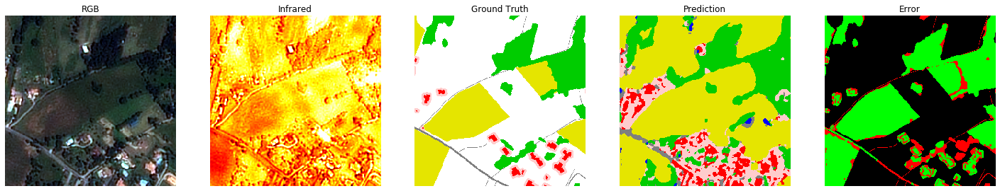


Urban : 46.87%  |  Water : 83.70%  |  Fields : 89.15%  |  Road : 45.23%  |  Vegetation : 74.11%  |  Buildings : 34.49%
Epoch  16 -> Train Overall Accuracy: 84.73% Train mIoU : 62.26% Train Loss: 0.1235
          -> lossC: 0.4191 lossD: 1.8476 DOA  11.98%



Urban : 47.31%  |  Water : 85.02%  |  Fields : 90.57%  |  Road : 44.07%  |  Vegetation : 74.32%  |  Buildings : 36.83%
Epoch  17 -> Train Overall Accuracy: 85.73% Train mIoU : 63.02% Train Loss: 0.0701
          -> lossC: 0.3945 lossD: 1.9084 DOA  9.64%



Urban : 46.57%  |  Water : 83.68%  |  Fields : 89.33%  |  Road : 45.07%  |  Vegetation : 73.69%  |  Buildings : 35.57%
Epoch  18 -> Train Overall Accuracy: 84.95% Train mIoU : 62.32% Train Loss: 0.0681
          -> lossC: 0.4230 lossD: 1.9718 DOA  7.55%


KeyboardInterrupt: ignored

In [ ]:
#[12]
args = mock.Mock() #stores the parameters
args.n_epoch = 100
args.n_epoch_test = int(5) #periodicity of evaluation on test set
args.batch_size = 16
args.n_class = 6
args.n_channel = 4
args.conv_width = [16,16,32,32,64,32]
args.dconv_width = [32,16,32,16]
args.cuda = 1
args.lr = 5e-3

train_full_CD(args)

tensor([[0.0000, 0.1164, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0773, 0.4484,
         0.1593],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0037, 0.0000,
         0.0000],
        [0.0000, 0.8980, 0.7009, 1.6940, 0.8271, 1.2322, 0.9842, 2.3843, 2.9622,
         2.8042]], device='cuda:0', grad_fn=<SliceBackward>)